In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

In [2]:
Rose1 = pd.read_csv("Rose.csv",parse_dates=True,index_col=0)

In [3]:
Rose1.head()


,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [4]:
Rose1.tail()

,Rose
YearMonth,
1995-03-01,45.0
1995-04-01,52.0
1995-05-01,28.0
1995-06-01,40.0
1995-07-01,62.0


In [5]:
Rose1.isnull().sum()

Rose    2
dtype: int64

In [6]:
Rose1.shape

(187, 1)

In [7]:
Rose1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-01 to 1995-07-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Rose    185 non-null    float64
dtypes: float64(1)
memory usage: 2.9 KB


In [8]:
rows_with_nan = []
for index, row in Rose1.iterrows():
    is_nan_series = row.isnull()
    if is_nan_series.any():
        rows_with_nan.append(index)
rows_with_nan

[Timestamp('1994-07-01 00:00:00'), Timestamp('1994-08-01 00:00:00')]

In [9]:
# Imputing null values using interpolation method
Rose=Rose1.interpolate()

In [10]:
Rose.isnull().sum()

Rose    0
dtype: int64

In [11]:
#Lets check the imputed values
Rose.loc[rows_with_nan,:]

,Rose
YearMonth,
1994-07-01,45.333333
1994-08-01,45.666667


In [12]:
from pylab import rcParams
rcParams['figure.figsize'] = 20,8

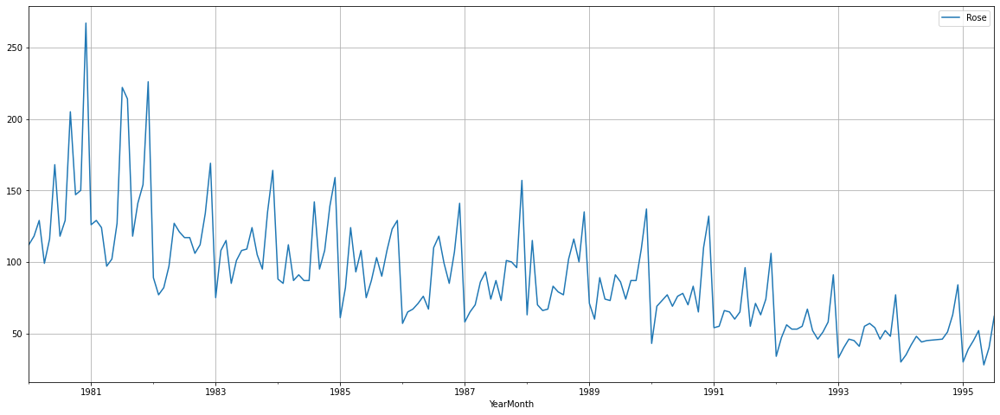

In [13]:
Rose.plot()
plt.grid();

In [14]:
Rose.describe()

,Rose
count,187.000000
mean,89.914439
std,39.238325
min,28.000000
25%,62.500000
50%,85.000000
75%,111.000000
max,267.000000


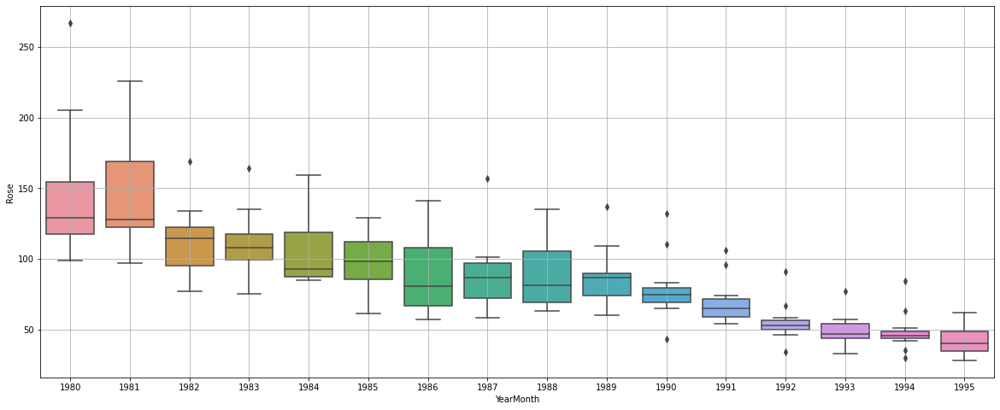

In [15]:
sns.boxplot(x = Rose.index.year,y = Rose['Rose'])
plt.grid();

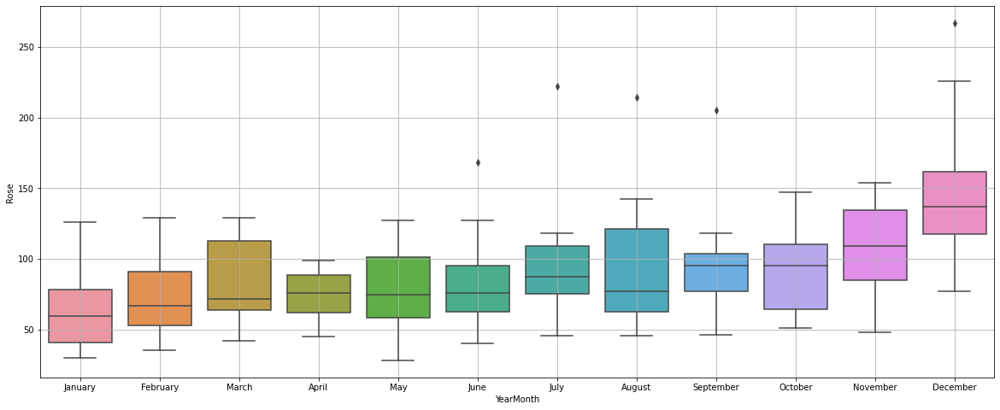

In [16]:
sns.boxplot(x = Rose.index.month_name(),y = Rose['Rose'])
plt.grid();

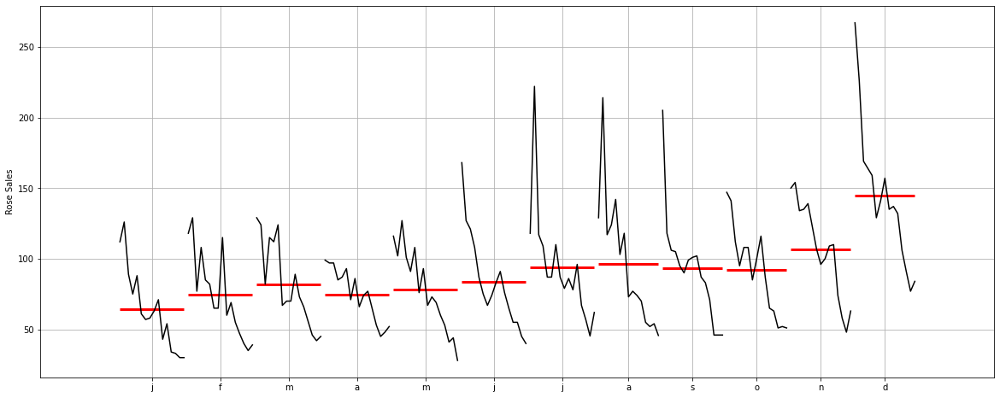

In [17]:
from statsmodels.graphics.tsaplots import month_plot

month_plot(Rose['Rose'],ylabel='Rose Sales')
plt.grid();

In [18]:
monthly_sales_across_years = pd.pivot_table(Rose, values = 'Rose', columns = Rose.index.month, index = Rose.index.year)
monthly_sales_across_years

YearMonth,1,2,3,4,5,6,7,8,9,10,11,12
YearMonth,,,,,,,,,,,,
1980,112.0,118.0,129.0,99.0,116.0,168.0,118.000000,129.000000,205.0,147.0,150.0,267.0
1981,126.0,129.0,124.0,97.0,102.0,127.0,222.000000,214.000000,118.0,141.0,154.0,226.0
1982,89.0,77.0,82.0,97.0,127.0,121.0,117.000000,117.000000,106.0,112.0,134.0,169.0
1983,75.0,108.0,115.0,85.0,101.0,108.0,109.000000,124.000000,105.0,95.0,135.0,164.0
1984,88.0,85.0,112.0,87.0,91.0,87.0,87.000000,142.000000,95.0,108.0,139.0,159.0
1985,61.0,82.0,124.0,93.0,108.0,75.0,87.000000,103.000000,90.0,108.0,123.0,129.0
1986,57.0,65.0,67.0,71.0,76.0,67.0,110.000000,118.000000,99.0,85.0,107.0,141.0
1987,58.0,65.0,70.0,86.0,93.0,74.0,87.000000,73.000000,101.0,100.0,96.0,157.0
1988,63.0,115.0,70.0,66.0,67.0,83.0,79.000000,77.000000,102.0,116.0,100.0,135.0


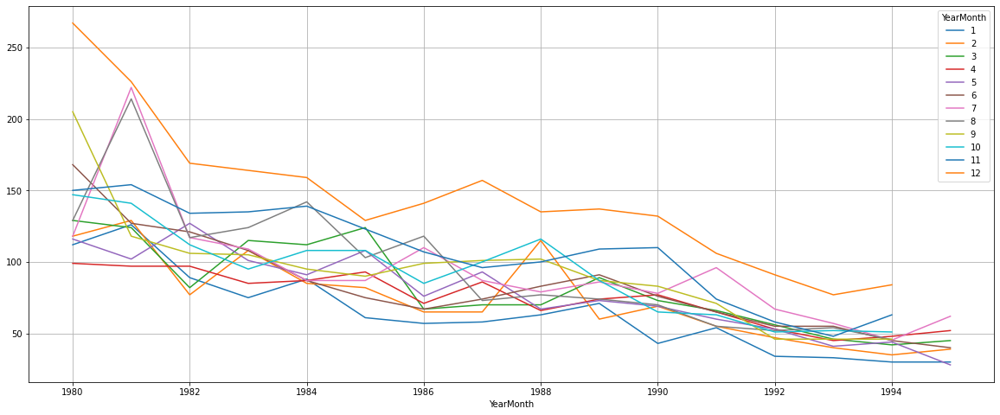

In [19]:
monthly_sales_across_years.plot()
plt.grid()


In [20]:
df_yearly_sum = Rose1.resample('A').sum()
df_yearly_sum.head()

,Rose
YearMonth,
1980-12-31,1758.0
1981-12-31,1780.0
1982-12-31,1348.0
1983-12-31,1324.0
1984-12-31,1280.0


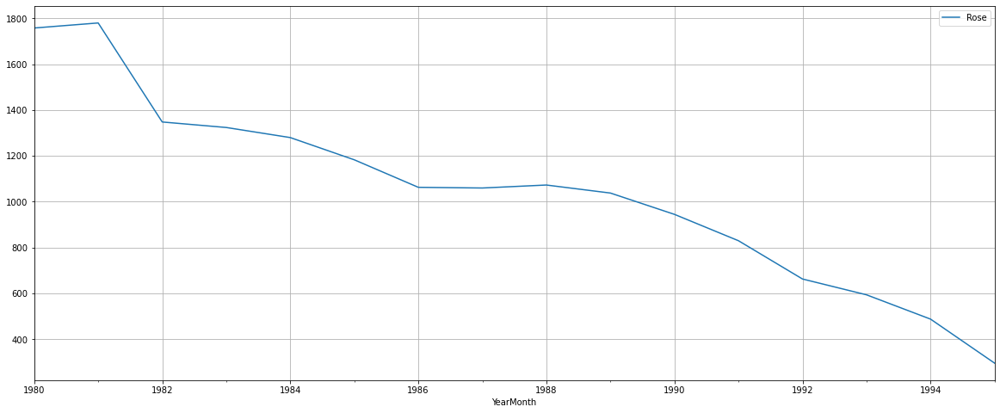

In [21]:
df_yearly_sum.plot()
plt.grid();

# Mean

In [22]:
df_yearly_mean = Rose1.resample('A').mean()
df_yearly_mean.head()

,Rose
YearMonth,
1980-12-31,146.500000
1981-12-31,148.333333
1982-12-31,112.333333
1983-12-31,110.333333
1984-12-31,106.666667


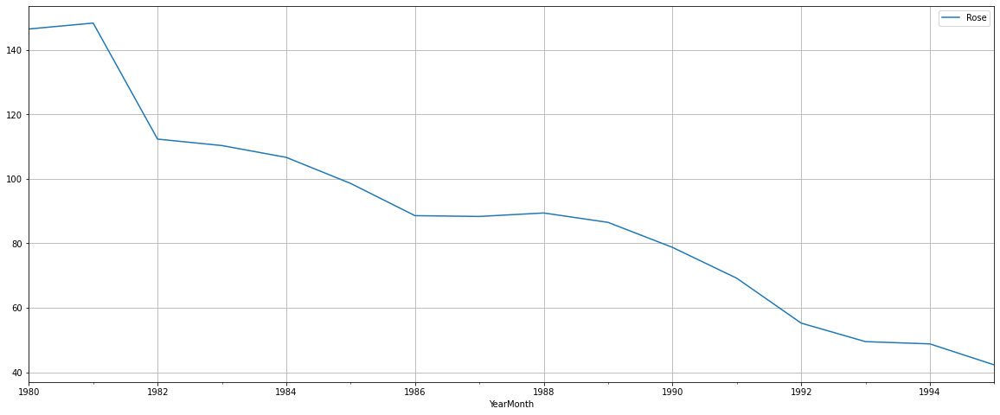

In [23]:
df_yearly_mean.plot();
plt.grid();

# Quaterly

In [24]:
df_yearly_Quaterly = Rose1.resample('Q').sum()
df_yearly_Quaterly.head()

,Rose
YearMonth,
1980-03-31,359.0
1980-06-30,383.0
1980-09-30,452.0
1980-12-31,564.0
1981-03-31,379.0


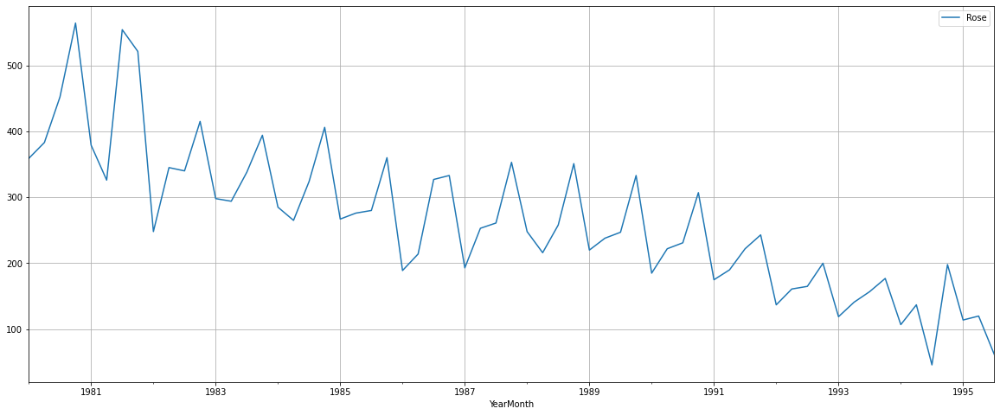

In [25]:
df_yearly_Quaterly.plot();
plt.grid();

# Daily

In [26]:
df_yearly_Daily = Rose1.resample('D').sum()
df_yearly_Daily.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-01-02,0.0
1980-01-03,0.0
1980-01-04,0.0
1980-01-05,0.0


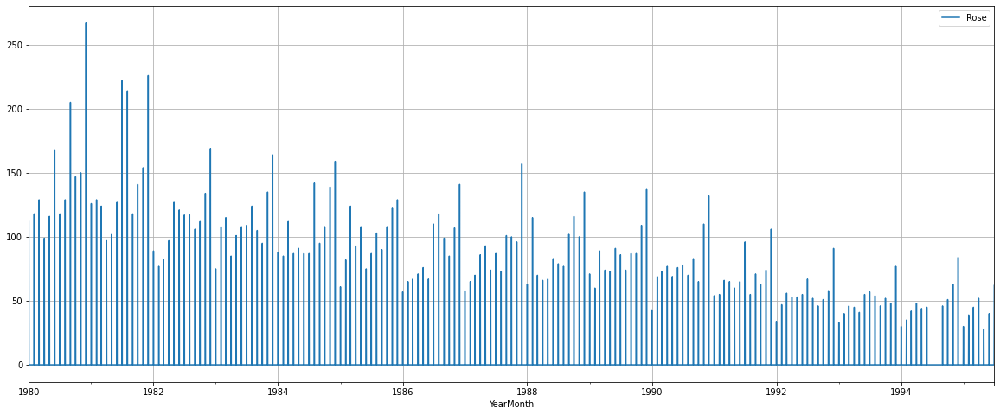

In [27]:
df_yearly_Daily.plot();
plt.grid();

# Decade --> 10 years

In [28]:
df_decade_sum = Rose1.resample('10Y').sum()
df_decade_sum.head()

,Rose
YearMonth,
1980-12-31,1758.0
1990-12-31,12094.0
2000-12-31,2871.0


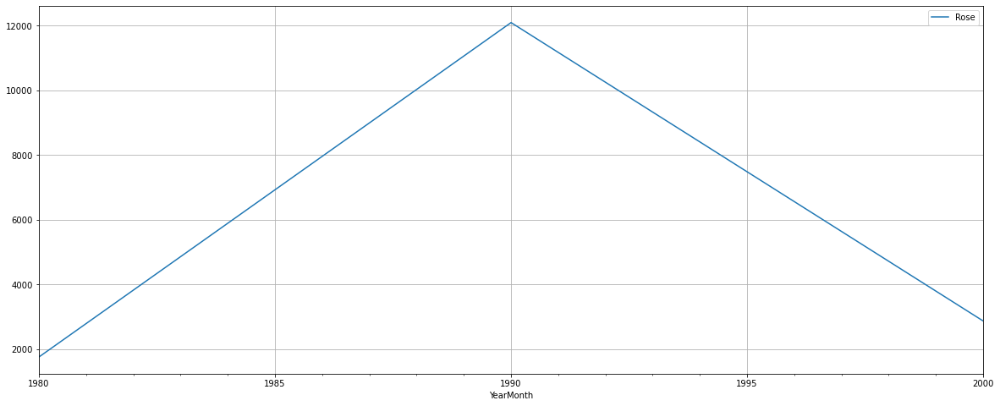

In [29]:
df_decade_sum.plot();
plt.grid();

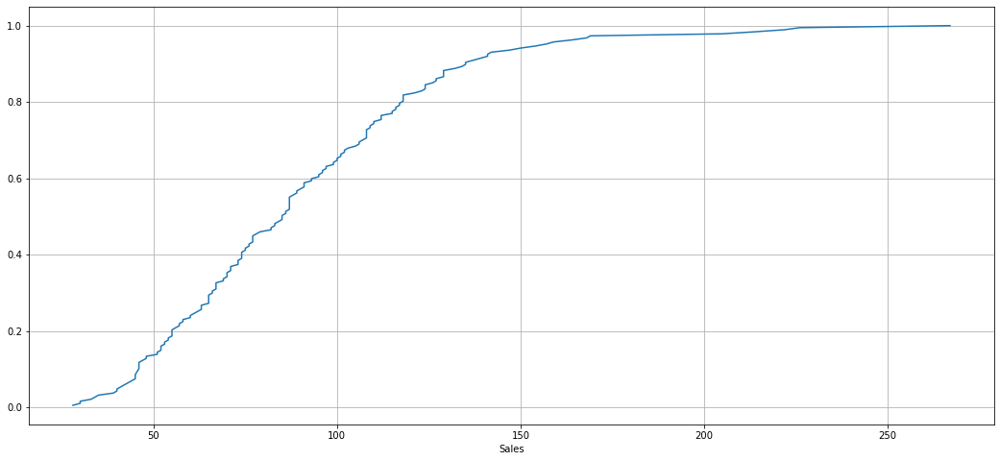

In [30]:
# statistics
from statsmodels.distributions.empirical_distribution import ECDF

plt.figure(figsize = (18, 8))
cdf = ECDF(Rose['Rose'])
plt.plot(cdf.x, cdf.y, label = "statmodels");
plt.grid()
plt.xlabel('Sales');

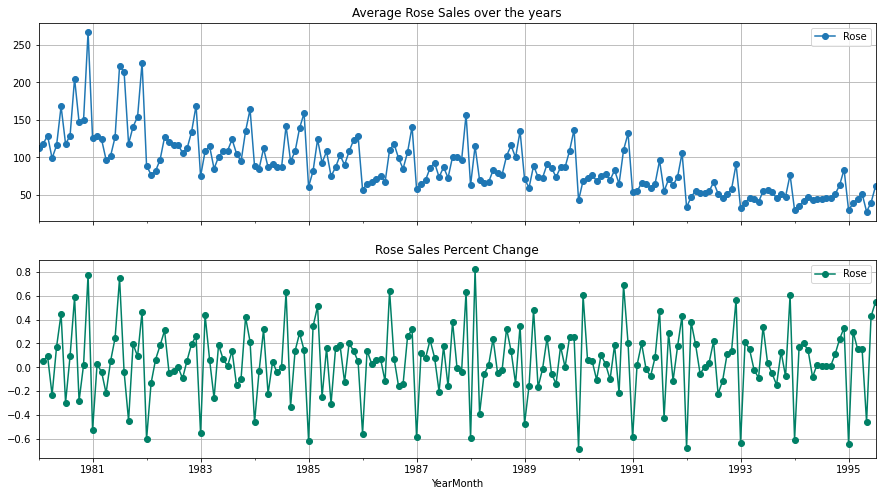

In [31]:
average    = Rose.groupby(Rose.index)["Rose"].mean()
pct_change = Rose.groupby(Rose.index)["Rose"].sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(15,8))

# plot average Rose over time(year-month)
ax1 = average.plot(legend=True,ax=axis1,marker='o',title="Average Rose Sales over the years",grid=True)
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())
# plot precent change for Rose over time(year-month)
ax2 = pct_change.plot(legend=True,ax=axis2,marker='o',colormap="summer",title="Rose Sales Percent Change",grid=True)

In [32]:
from    statsmodels.tsa.seasonal import   seasonal_decompose

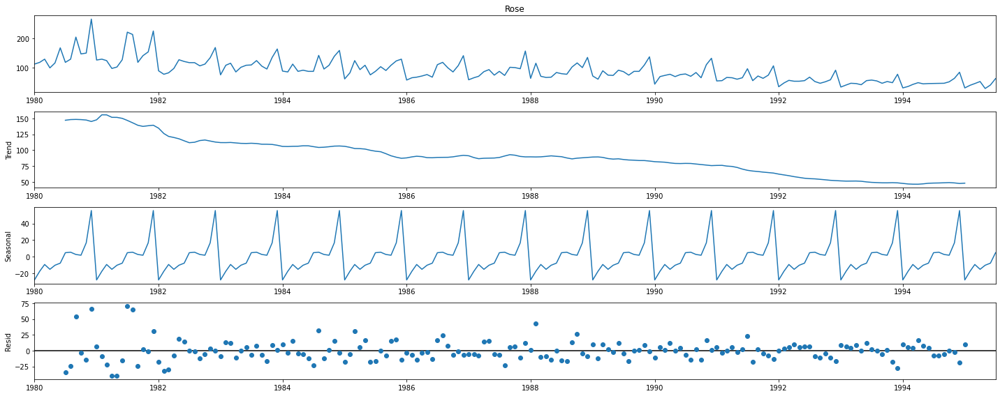

In [33]:
decomposition = seasonal_decompose(Rose['Rose'],model='additive')
decomposition.plot();

In [34]:
trend = decomposition.trend
trend.head(15)

YearMonth
1980-01-01           NaN
1980-02-01           NaN
1980-03-01           NaN
1980-04-01           NaN
1980-05-01           NaN
1980-06-01           NaN
1980-07-01    147.083333
1980-08-01    148.125000
1980-09-01    148.375000
1980-10-01    148.083333
1980-11-01    147.416667
1980-12-01    145.125000
1981-01-01    147.750000
1981-02-01    155.625000
1981-03-01    155.541667
Name: trend, dtype: float64

In [35]:
trend = decomposition.trend
residual = decomposition.resid

In [36]:
deseasonlised_ts=trend + residual


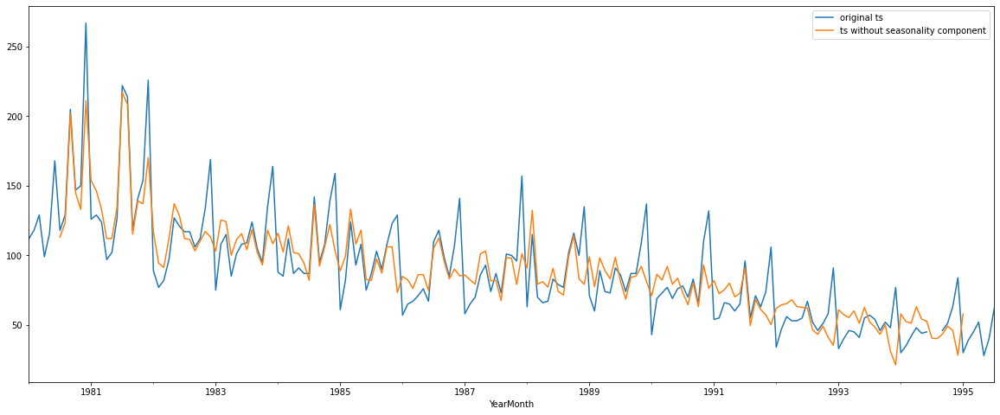

In [37]:
Rose1.plot()
deseasonlised_ts.plot()
plt.legend(['original ts','ts without seasonality component'])

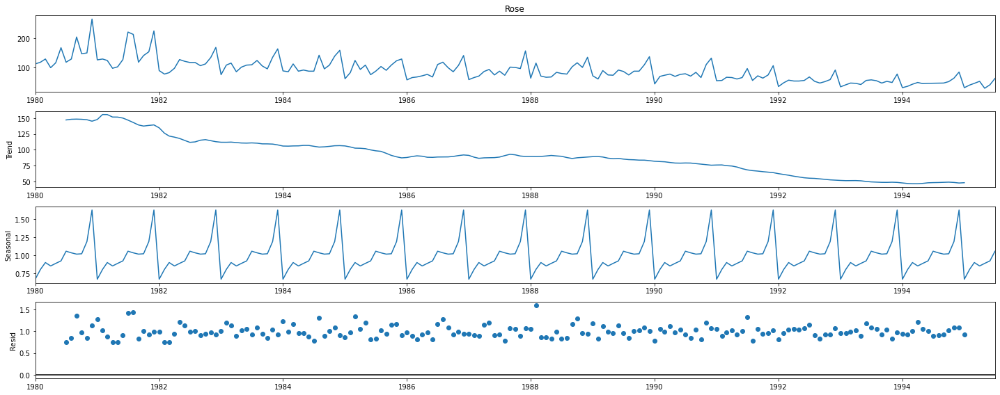

In [38]:
decomposition = seasonal_decompose(Rose['Rose'],model='multiplicative')
decomposition.plot();

In [39]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 YearMonth
1980-01-01           NaN
1980-02-01           NaN
1980-03-01           NaN
1980-04-01           NaN
1980-05-01           NaN
1980-06-01           NaN
1980-07-01    147.083333
1980-08-01    148.125000
1980-09-01    148.375000
1980-10-01    148.083333
1980-11-01    147.416667
1980-12-01    145.125000
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01    0.670111
1980-02-01    0.806163
1980-03-01    0.901164
1980-04-01    0.854024
1980-05-01    0.889415
1980-06-01    0.923985
1980-07-01    1.058038
1980-08-01    1.035881
1980-09-01    1.017648
1980-10-01    1.022573
1980-11-01    1.192349
1980-12-01    1.628646
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01         NaN
1980-02-01         NaN
1980-03-01         NaN
1980-04-01         NaN
1980-05-01         NaN
1980-06-01         NaN
1980-07-01    0.758258
1980-08-01    0.840720
1980-09-01    1.357674
1980-10-01    0.970771
1980-11-01    0.853378
1980-12-01    1.129646
Name: resid, dtype: fl

#From above both the model we can say that the additive model can be used to analyse and forecast the future data.

# Question 3

# Split the data into training and test.The test data should start in 1991.

In [40]:
Rose_train=Rose[Rose.index.year < 1991]
Rose_test=Rose[Rose.index.year >= 1991]

In [41]:
from IPython.display import display

# to display multiple dataframe from one cell

In [42]:
print('First few rows of Rose_training Data')
display(Rose_train.head())
print('Last few rows of Rose_training Data')
display(Rose_train.tail())
print('First few rows of Rose_test Data')
display(Rose_test.head())
print('Last few rows of Rose_test Data')
display(Rose_test.tail())

First few rows of Rose_training Data


,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


Last few rows of Rose_training Data


,Rose
YearMonth,
1990-08-01,70.0
1990-09-01,83.0
1990-10-01,65.0
1990-11-01,110.0
1990-12-01,132.0


First few rows of Rose_test Data


,Rose
YearMonth,
1991-01-01,54.0
1991-02-01,55.0
1991-03-01,66.0
1991-04-01,65.0
1991-05-01,60.0


Last few rows of Rose_test Data


,Rose
YearMonth,
1995-03-01,45.0
1995-04-01,52.0
1995-05-01,28.0
1995-06-01,40.0
1995-07-01,62.0


In [43]:
print(Rose_train.shape)
print(Rose_test.shape)

(132, 1)
(55, 1)


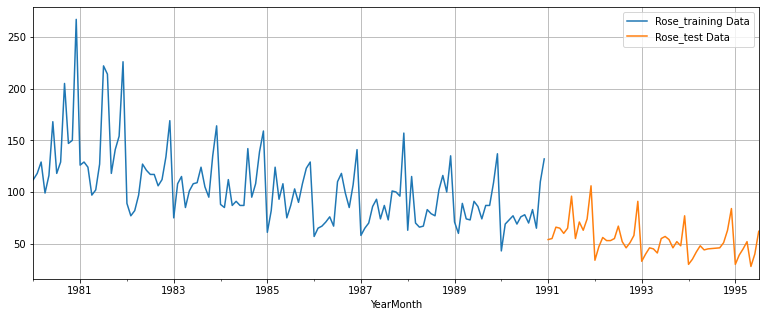

In [44]:
Rose_train['Rose'].plot(figsize=(13,5))
Rose_test['Rose'].plot(figsize=(13,5))
plt.grid()
plt.legend(['Rose_training Data','Rose_test Data'])
plt.show()

# Question 4

# Build all the exponential smoothing models on the training data and evaluate the model using RMSE on the test data. Other model such as regression ,naive forecast models and simple average models. Should also be built on the training data and check the performance on the test data using RMSE.

# MOdel 1: Linear Regression

we need to modify our rose training data before fitting into linear regression

In [45]:
Rose_train_time = [i+1 for i in range(len(Rose_train))]
Rose_test_time = [i+len(Rose_train)+1 for i in range(len(Rose_test))]
print('Rose_training Time instance','\n',Rose_train_time)
print('Rose_test Time instance','\n',Rose_test_time)

Rose_training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]
Rose_test Time instance 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [46]:
LinearRegression_Rose_train = Rose_train.copy()
LinearRegression_Rose_test = Rose_test.copy()

In [47]:
LinearRegression_Rose_train['time'] = Rose_train_time
LinearRegression_Rose_test['time'] = Rose_test_time

In [48]:
print('First rows of Rose_training Data','\n',LinearRegression_Rose_train.head(),'\n')
print('Last rows of Rose_training Data','\n',LinearRegression_Rose_train.tail(),'\n')
print('First rows of Rose_test Data','\n',LinearRegression_Rose_test.head(),'\n')
print('Last rows of Rose_test Data','\n',LinearRegression_Rose_test.tail(),'\n')

First rows of Rose_training Data 
              Rose  time
YearMonth              
1980-01-01  112.0     1
1980-02-01  118.0     2
1980-03-01  129.0     3
1980-04-01   99.0     4
1980-05-01  116.0     5 

Last rows of Rose_training Data 
              Rose  time
YearMonth              
1990-08-01   70.0   128
1990-09-01   83.0   129
1990-10-01   65.0   130
1990-11-01  110.0   131
1990-12-01  132.0   132 

First rows of Rose_test Data 
             Rose  time
YearMonth             
1991-01-01  54.0   133
1991-02-01  55.0   134
1991-03-01  66.0   135
1991-04-01  65.0   136
1991-05-01  60.0   137 

Last rows of Rose_test Data 
             Rose  time
YearMonth             
1995-03-01  45.0   183
1995-04-01  52.0   184
1995-05-01  28.0   185
1995-06-01  40.0   186
1995-07-01  62.0   187 



In [49]:
from sklearn.linear_model import LinearRegression

In [50]:
Rose_lr = LinearRegression()

In [51]:
Rose_lr.fit(LinearRegression_Rose_train[['time']],LinearRegression_Rose_train['Rose'].values)

LinearRegression()

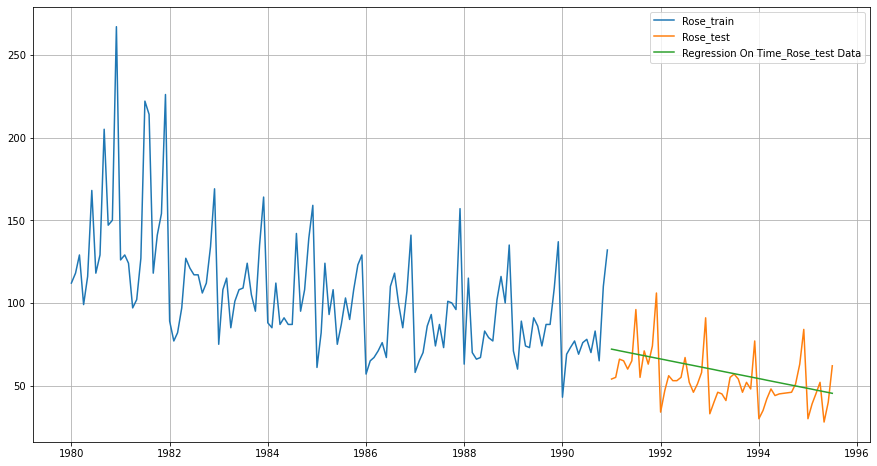

In [52]:
Rose_test_predictions_model1 = Rose_lr.predict(LinearRegression_Rose_test[['time']])
LinearRegression_Rose_test['RegOnTime'] = Rose_test_predictions_model1

plt.figure(figsize=(15,8))
plt.plot( Rose_train['Rose'], label='Rose_train')
plt.plot(Rose_test['Rose'], label='Rose_test')
plt.plot(LinearRegression_Rose_test['RegOnTime'], label='Regression On Time_Rose_test Data')
plt.grid();
plt.legend(loc='best')

In [53]:
from sklearn import metrics

In [54]:
rmse_model1_Rose_test = metrics.mean_squared_error(Rose_test['Rose'],Rose_test_predictions_model1,squared=False)
print("For RegressionOnTime forecast on the Rose_test Data,  RMSE is %3.3f" %(rmse_model1_Rose_test))

For RegressionOnTime forecast on the Rose_test Data,  RMSE is 15.269


In [55]:
results_RoseDf = pd.DataFrame({'Rose_test RMSE': [rmse_model1_Rose_test]},index=['RegressionOnTime'])
results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955


# MOdel :2 - Naive bayes

In [56]:
NaiveModel_Rose_train = Rose_train.copy()
NaiveModel_Rose_test = Rose_test.copy()

In [57]:
NaiveModel_Rose_test.head()

,Rose
YearMonth,
1991-01-01,54.0
1991-02-01,55.0
1991-03-01,66.0
1991-04-01,65.0
1991-05-01,60.0


In [58]:
NaiveModel_Rose_test['naive'] = np.asarray(Rose_train['Rose'])[len(np.asarray(Rose_train['Rose']))-1]
NaiveModel_Rose_test['naive'].head()

YearMonth
1991-01-01    132.0
1991-02-01    132.0
1991-03-01    132.0
1991-04-01    132.0
1991-05-01    132.0
Name: naive, dtype: float64

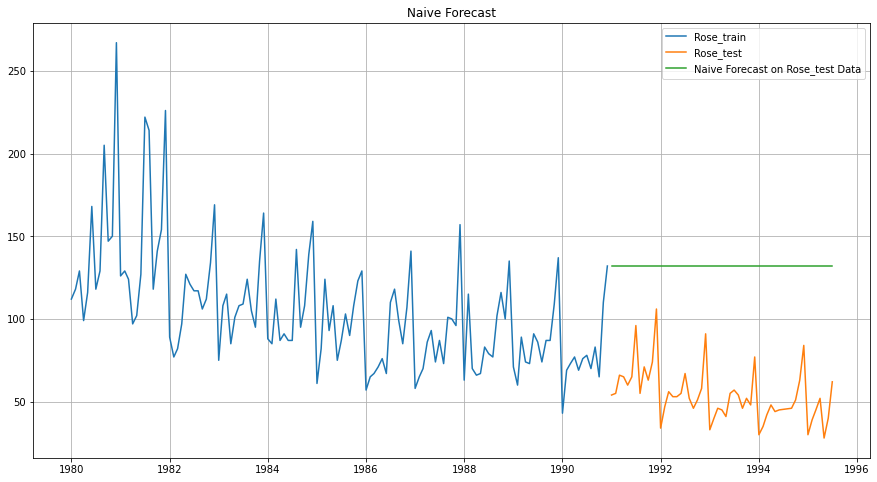

In [59]:
plt.figure(figsize=(15,8))
plt.plot(NaiveModel_Rose_train['Rose'], label='Rose_train')
plt.plot(Rose_test['Rose'], label='Rose_test')
plt.plot(NaiveModel_Rose_test['naive'], label='Naive Forecast on Rose_test Data')
plt.title("Naive Forecast")
plt.grid();
plt.legend(loc='best')

In [60]:
rmse_model2_Rose_test = metrics.mean_squared_error(Rose_test['Rose'],NaiveModel_Rose_test['naive'],squared=False)
print("For NAive Based forecast on the Rose_test Data,  RMSE is %3.3f" %(rmse_model2_Rose_test))

For NAive Based forecast on the Rose_test Data,  RMSE is 79.719


In [61]:
results_RoseDf_2 = pd.DataFrame({'Rose_test RMSE': [rmse_model2_Rose_test]},index=['NaiveModel'])

results_RoseDf = pd.concat([results_RoseDf, results_RoseDf_2])
results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773


# Model :3 - Simple Average

In [62]:
SimpleAverage_Rose_train = Rose_train.copy()
SimpleAverage_Rose_test = Rose_test.copy()

In [63]:
SimpleAverage_Rose_test['mean_forecast'] = Rose_train['Rose'].mean()
SimpleAverage_Rose_test.head()

,Rose,mean_forecast
YearMonth,,
1991-01-01,54.0,104.939394
1991-02-01,55.0,104.939394
1991-03-01,66.0,104.939394
1991-04-01,65.0,104.939394
1991-05-01,60.0,104.939394


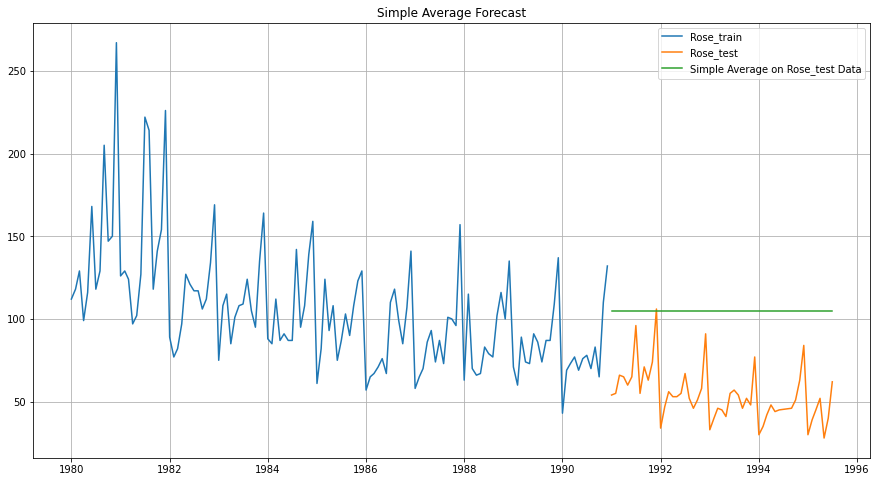

In [64]:
plt.figure(figsize=(15,8))
plt.plot(SimpleAverage_Rose_train['Rose'], label='Rose_train')
plt.plot(SimpleAverage_Rose_test['Rose'], label='Rose_test')
plt.plot(SimpleAverage_Rose_test['mean_forecast'], label='Simple Average on Rose_test Data')
plt.title("Simple Average Forecast")
plt.grid();
plt.legend(loc='best')

In [65]:
rmse_model3_Rose_test = metrics.mean_squared_error(Rose_test['Rose'],SimpleAverage_Rose_test['mean_forecast'],squared=False)
print("For Simple Average forecast on the Rose_test Data,  RMSE is %3.3f" %(rmse_model3_Rose_test))

For Simple Average forecast on the Rose_test Data,  RMSE is 53.461


In [66]:
results_RoseDf_3 = pd.DataFrame({'Rose_test RMSE': [rmse_model3_Rose_test]},index=['SimpleAverageModel'])

results_RoseDf = pd.concat([results_RoseDf, results_RoseDf_3])
results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570


# MOdel 4: MOving Average

In [67]:
MovingAverage_Rose = Rose.copy()
MovingAverage_Rose.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [68]:
MovingAverage_Rose['Trailing_2'] = MovingAverage_Rose['Rose'].rolling(2).mean()
MovingAverage_Rose['Trailing_4'] = MovingAverage_Rose['Rose'].rolling(4).mean()
MovingAverage_Rose['Trailing_6'] = MovingAverage_Rose['Rose'].rolling(6).mean()
MovingAverage_Rose['Trailing_9'] = MovingAverage_Rose['Rose'].rolling(9).mean()

MovingAverage_Rose.head(10)

,Rose,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,112.0,NaN,NaN,NaN,NaN
1980-02-01,118.0,115.0,NaN,NaN,NaN
1980-03-01,129.0,123.5,NaN,NaN,NaN
1980-04-01,99.0,114.0,114.50,NaN,NaN
1980-05-01,116.0,107.5,115.50,NaN,NaN
1980-06-01,168.0,142.0,128.00,123.666667,NaN
1980-07-01,118.0,143.0,125.25,124.666667,NaN
1980-08-01,129.0,123.5,132.75,126.500000,NaN
1980-09-01,205.0,167.0,155.00,139.166667,132.666667


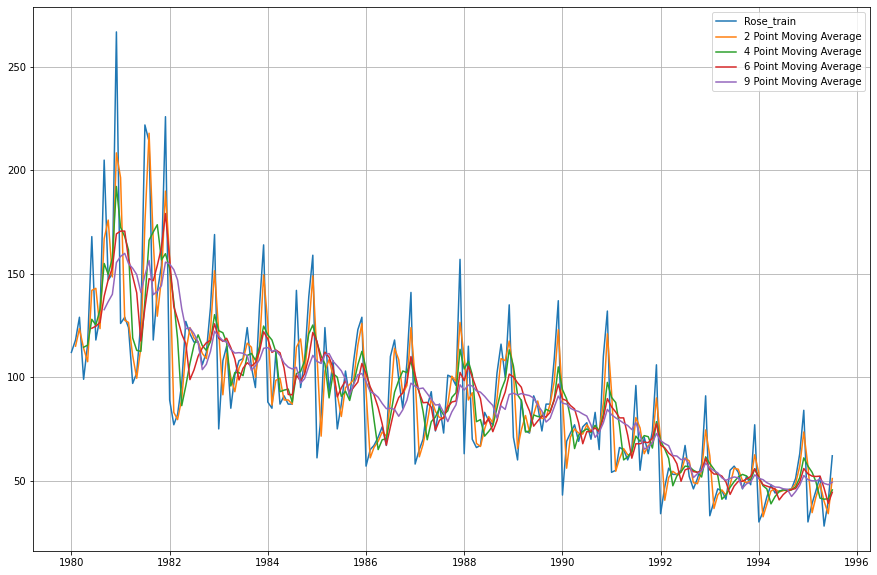

In [69]:
plt.figure(figsize=(15,10))
plt.plot(MovingAverage_Rose['Rose'], label='Rose_train')
plt.plot(MovingAverage_Rose['Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage_Rose['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage_Rose['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage_Rose['Trailing_9'],label = '9 Point Moving Average')
plt.grid();
plt.legend(loc='best')

In [70]:
MovingAverage_Rose_train = Rose_train.copy()
MovingAverage_Rose_train.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [71]:
MovingAverage_Rose_train['Trailing_2'] = MovingAverage_Rose_train['Rose'].rolling(2).mean()
MovingAverage_Rose_train['Trailing_4'] = MovingAverage_Rose_train['Rose'].rolling(4).mean()
MovingAverage_Rose_train['Trailing_6'] = MovingAverage_Rose_train['Rose'].rolling(6).mean()
MovingAverage_Rose_train['Trailing_9'] = MovingAverage_Rose_train['Rose'].rolling(9).mean()

MovingAverage_Rose_train.head(10)

,Rose,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,112.0,NaN,NaN,NaN,NaN
1980-02-01,118.0,115.0,NaN,NaN,NaN
1980-03-01,129.0,123.5,NaN,NaN,NaN
1980-04-01,99.0,114.0,114.50,NaN,NaN
1980-05-01,116.0,107.5,115.50,NaN,NaN
1980-06-01,168.0,142.0,128.00,123.666667,NaN
1980-07-01,118.0,143.0,125.25,124.666667,NaN
1980-08-01,129.0,123.5,132.75,126.500000,NaN
1980-09-01,205.0,167.0,155.00,139.166667,132.666667


In [72]:
MovingAverage_Rose_train.tail()

,Rose,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1990-08-01,70.0,74.0,73.25,73.833333,76.888889
1990-09-01,83.0,76.5,76.75,75.500000,70.888889
1990-10-01,65.0,74.0,74.00,73.500000,73.333333
1990-11-01,110.0,87.5,82.00,80.333333,77.888889
1990-12-01,132.0,121.0,97.50,89.666667,84.444444


In [73]:
MovingAverage_Rose_test = Rose_test.copy()

In [74]:
MovingAverage_Rose_train.shape[0]

132

In [75]:
x=MovingAverage_Rose_train.iloc[MovingAverage_Rose_train.shape[0]-1,:]
x

Rose          132.000000
Trailing_2    121.000000
Trailing_4     97.500000
Trailing_6     89.666667
Trailing_9     84.444444
Name: 1990-12-01 00:00:00, dtype: float64

In [76]:
MovingAverage_Rose_test['Trailing_2'] = np.asarray(MovingAverage_Rose_train['Trailing_2'])[len(np.asarray(MovingAverage_Rose_train['Trailing_2']))-1]
MovingAverage_Rose_test['Trailing_4']= np.asarray(MovingAverage_Rose_train['Trailing_4'])[len(np.asarray(MovingAverage_Rose_train['Trailing_4']))-1]
MovingAverage_Rose_test['Trailing_6'] = np.asarray(MovingAverage_Rose_train['Trailing_6'])[len(np.asarray(MovingAverage_Rose_train['Trailing_6']))-1]
MovingAverage_Rose_test['Trailing_9'] = np.asarray(MovingAverage_Rose_train['Trailing_9'])[len(np.asarray(MovingAverage_Rose_train['Trailing_9']))-1]
MovingAverage_Rose_test.head()

,Rose,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1991-01-01,54.0,121.0,97.5,89.666667,84.444444
1991-02-01,55.0,121.0,97.5,89.666667,84.444444
1991-03-01,66.0,121.0,97.5,89.666667,84.444444
1991-04-01,65.0,121.0,97.5,89.666667,84.444444
1991-05-01,60.0,121.0,97.5,89.666667,84.444444


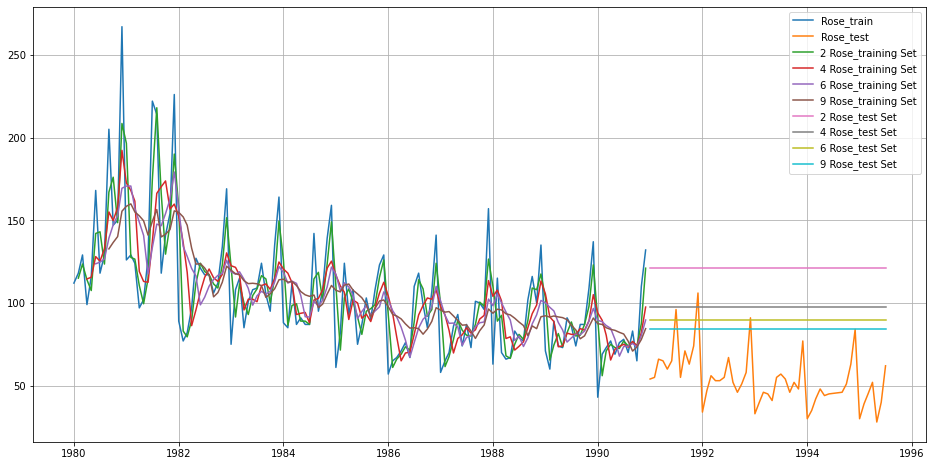

In [77]:
plt.figure(figsize=(16,8))
plt.plot(MovingAverage_Rose_train['Rose'], label='Rose_train')
plt.plot(MovingAverage_Rose_test['Rose'], label='Rose_test')

plt.plot(MovingAverage_Rose_train['Trailing_2'], label='2 Rose_training Set')
plt.plot(MovingAverage_Rose_train['Trailing_4'], label='4 Rose_training Set')
plt.plot(MovingAverage_Rose_train['Trailing_6'],label = '6 Rose_training Set')
plt.plot(MovingAverage_Rose_train['Trailing_9'],label = '9 Rose_training Set')

plt.plot(MovingAverage_Rose_test['Trailing_2'], label='2 Rose_test Set')
plt.plot(MovingAverage_Rose_test['Trailing_4'], label='4 Rose_test Set')
plt.plot(MovingAverage_Rose_test['Trailing_6'],label = '6 Rose_test Set')
plt.plot(MovingAverage_Rose_test['Trailing_9'],label = '9 Rose_test Set')
plt.legend(loc = 'best')
plt.grid();

In [78]:
## Rose_test Data - RMSE  --> 2 point Trailing MA

rmse_model4_Rose_test_2 = metrics.mean_squared_error(Rose_test['Rose'],MovingAverage_Rose_test['Trailing_2'],squared=False)
print("For 2 point Moving Average Model forecast on the Rose_training Data,  RMSE is %3.3f" %(rmse_model4_Rose_test_2))

## Rose_test Data - RMSE  --> 4 point Trailing MA

rmse_model4_Rose_test_4 = metrics.mean_squared_error(Rose_test['Rose'],MovingAverage_Rose_test['Trailing_4'],squared=False)
print("For 4 point Moving Average Model forecast on the Rose_test Data,  RMSE is %3.3f" %(rmse_model4_Rose_test_4))

## Rose_test Data - RMSE --> 6 point Trailing MA

rmse_model4_Rose_test_6 = metrics.mean_squared_error(Rose_test['Rose'],MovingAverage_Rose_test['Trailing_6'],squared=False)
print("For 6 point Moving Average Model forecast on the Rose_test Data,  RMSE is %3.3f" %(rmse_model4_Rose_test_6))

## Rose_test Data - RMSE  --> 9 point Trailing MA

rmse_model4_Rose_test_9 = metrics.mean_squared_error(Rose_test['Rose'],MovingAverage_Rose_test['Trailing_9'],squared=False)
print("For 9 point Moving Average Model forecast on the Rose_test Data,  RMSE is %3.3f " %(rmse_model4_Rose_test_9))

For 2 point Moving Average Model forecast on the Rose_training Data,  RMSE is 68.970
For 4 point Moving Average Model forecast on the Rose_test Data,  RMSE is 46.404
For 6 point Moving Average Model forecast on the Rose_test Data,  RMSE is 39.126
For 9 point Moving Average Model forecast on the Rose_test Data,  RMSE is 34.411 


In [79]:
results_RoseDf_4 = pd.DataFrame({'Rose_test RMSE': [rmse_model4_Rose_test_2,rmse_model4_Rose_test_4
                                          ,rmse_model4_Rose_test_6,rmse_model4_Rose_test_9]}
                           ,index=['2point_MovingAverage_Rose','4point_MovingAverage_Rose'
                                   ,'6point_MovingAverage_Rose','9point_MovingAverage_Rose'])

results_RoseDf = pd.concat([results_RoseDf, results_RoseDf_4])
results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570
2point_MovingAverage_Rose,68.970159
4point_MovingAverage_Rose,46.403626
6point_MovingAverage_Rose,39.126446
9point_MovingAverage_Rose,34.410938


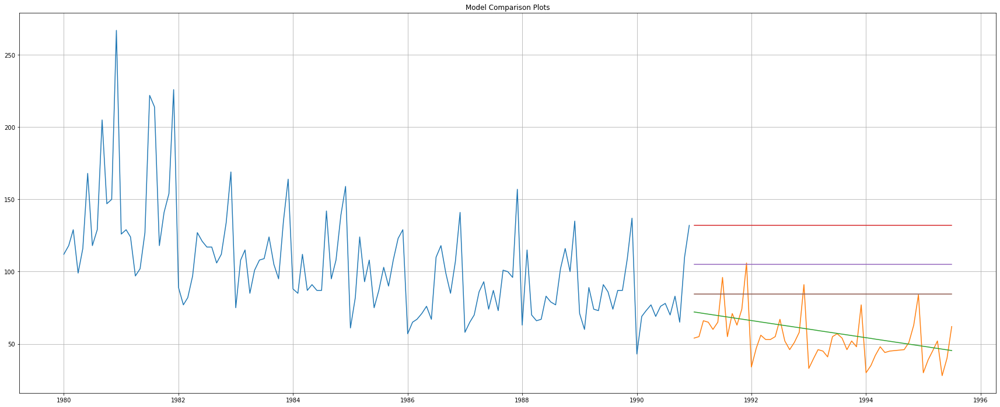

In [80]:
## Plotting on both Rose_training and Rose_test data

plt.figure(figsize=(30,12))
plt.plot(Rose_train['Rose'], label='Rose_train')
plt.plot(Rose_test['Rose'], label='Rose_test')

plt.plot(LinearRegression_Rose_test['RegOnTime'], label='Regression On Time_Rose_test Data')

plt.plot(NaiveModel_Rose_test['naive'], label='Naive Forecast on Rose_test Data')

plt.plot(SimpleAverage_Rose_test['mean_forecast'], label='Simple Average on Rose_test Data')

plt.plot(MovingAverage_Rose_test['Trailing_9'], label='9 Point Trailing Moving Average on Rose_training Set')

plt.title("Model Comparison Plots")
plt.grid();

# MOdel 5: simple exponantial smoothing

In [81]:
from statsmodels.tsa.api import ExponentialSmoothing,SimpleExpSmoothing,Holt

In [82]:
SES_Rose_train = Rose_train.copy()
SES_Rose_test = Rose_test.copy()

In [83]:
model_SES_Rose = SimpleExpSmoothing(SES_Rose_train['Rose'])

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [84]:
model_SES_Rose_autofit = model_SES_Rose.fit(optimized=True)

In [85]:
model_SES_Rose_autofit.params

{'smoothing_level': 0.0987493111726833,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 134.38720226208358,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [86]:
SES_Rose_test['predict'] = model_SES_Rose_autofit.forecast(steps=len(Rose_test))
SES_Rose_test.head()

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


,Rose,predict
YearMonth,,
1991-01-01,54.0,87.104983
1991-02-01,55.0,87.104983
1991-03-01,66.0,87.104983
1991-04-01,65.0,87.104983
1991-05-01,60.0,87.104983


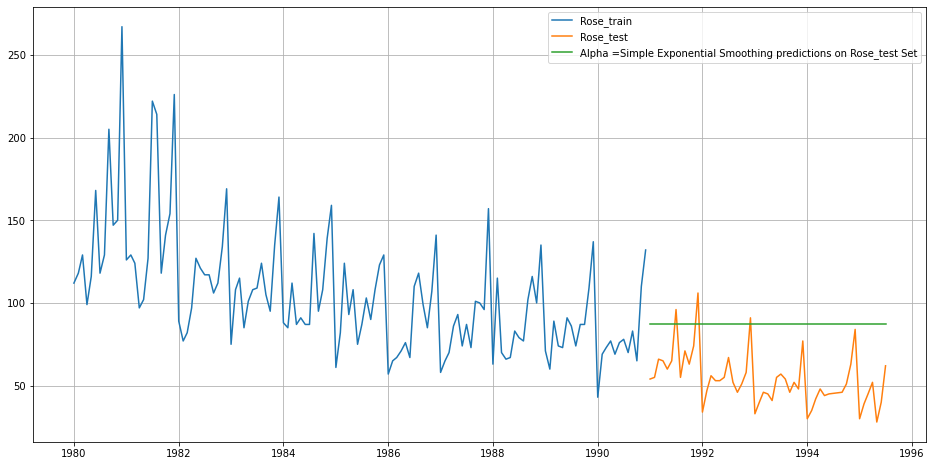

In [87]:
## Plotting on both the Rose_training and Rose_test data

plt.figure(figsize=(16,8))
plt.plot(SES_Rose_train['Rose'], label='Rose_train')
plt.plot(SES_Rose_test['Rose'], label='Rose_test')

plt.plot(SES_Rose_test['predict'], label='Alpha =Simple Exponential Smoothing predictions on Rose_test Set')

plt.legend(loc='best')
plt.grid()


# model evaluation for alpha=0.987 simple exponential smoothing

In [88]:
rmse_model5_Rose_test_1 = metrics.mean_squared_error(SES_Rose_test['Rose'],SES_Rose_test['predict'],squared=False)
print("For Alpha =0.0987 Simple Exponential Smoothing Model forecast on the Rose_test Data, RMSE is %3.3f" %(rmse_model5_Rose_test_1))


For Alpha =0.0987 Simple Exponential Smoothing Model forecast on the Rose_test Data, RMSE is 36.796


In [89]:
results_RoseDf_5 = pd.DataFrame({'Rose_test RMSE': [rmse_model5_Rose_test_1]},index=['Alpha=0.0987,SimpleExponentialSmoothing'])

results_RoseDf = pd.concat([results_RoseDf, results_RoseDf_5])
results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570
2point_MovingAverage_Rose,68.970159
4point_MovingAverage_Rose,46.403626
6point_MovingAverage_Rose,39.126446
9point_MovingAverage_Rose,34.410938
"Alpha=0.0987,SimpleExponentialSmoothing",36.796227


In [90]:
results_RoseDf_6 = pd.DataFrame({'Alpha Values':[],'Rose_train RMSE':[],'Rose_test RMSE': []})
results_RoseDf_6

,Alpha Values,Rose_train RMSE,Rose_test RMSE


In [91]:
for i in np.arange(0,1,0.05):
    model_SES_Rose_alpha_i = model_SES_Rose.fit(smoothing_level=i,optimized=False,use_brute=True)
    SES_Rose_train['predict',i] = model_SES_Rose_alpha_i.fittedvalues
    SES_Rose_test['predict',i] = model_SES_Rose_alpha_i.forecast(steps=len(Rose_test))
    
    rmse_model5_Rose_train_i = metrics.mean_squared_error(SES_Rose_train['Rose'],SES_Rose_train['predict',i],squared=False)
    
    rmse_model5_Rose_test_i = metrics.mean_squared_error(SES_Rose_test['Rose'],SES_Rose_test['predict',i],squared=False)
    
    results_RoseDf_6 = results_RoseDf_6.append({'Alpha Values':i,'Rose_train RMSE':rmse_model5_Rose_train_i 
                                      ,'Rose_test RMSE':rmse_model5_Rose_test_i}, ignore_index=True)

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\t

In [92]:
results_RoseDf_6.sort_values(by=['Rose_test RMSE'],ascending=True)

,Alpha Values,Rose_train RMSE,Rose_test RMSE
2,0.10,31.815610,36.828033
1,0.05,32.449102,37.011448
3,0.15,31.809845,38.722125
4,0.20,31.979391,41.361876
5,0.25,32.211871,44.360796
6,0.30,32.470164,47.504821
7,0.35,32.744341,50.665672
8,0.40,33.035130,53.767406
9,0.45,33.346578,56.767133
10,0.50,33.682839,59.641786


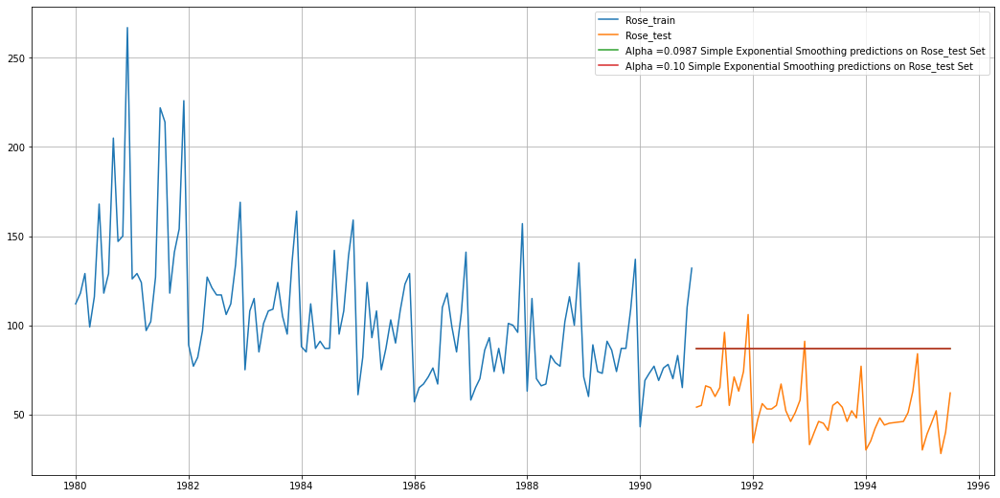

In [93]:
## Plotting on both the Rose_training and Rose_test data

plt.figure(figsize=(18,9))
plt.plot(SES_Rose_train['Rose'], label='Rose_train')
plt.plot(SES_Rose_test['Rose'], label='Rose_test')

plt.plot(SES_Rose_test['predict'], label='Alpha =0.0987 Simple Exponential Smoothing predictions on Rose_test Set')

plt.plot(SES_Rose_test['predict', 0.10], label='Alpha =0.10 Simple Exponential Smoothing predictions on Rose_test Set')



plt.legend(loc='best')
plt.grid();

In [94]:
results_RoseDf_6_1 = pd.DataFrame({'Rose_test RMSE': [results_RoseDf_6.sort_values(by=['Rose_test RMSE'],ascending=True).values[0][2]]}
                           ,index=['Alpha=0.10,SimpleExponentialSmoothing'])

results_RoseDf = pd.concat([results_RoseDf, results_RoseDf_6_1])
results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570
2point_MovingAverage_Rose,68.970159
4point_MovingAverage_Rose,46.403626
6point_MovingAverage_Rose,39.126446
9point_MovingAverage_Rose,34.410938
"Alpha=0.0987,SimpleExponentialSmoothing",36.796227
"Alpha=0.10,SimpleExponentialSmoothing",36.828033


# Model 6: Double Exponential Smoothing

In [95]:
DES_Rose_train = Rose_train.copy()
DES_Rose_test = Rose_test.copy()

In [96]:
model_DES_Rose = Holt(DES_Rose_train['Rose'])

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [97]:
model_DES_Rose_autofit = model_DES_Rose.fit(optimized=True)

In [98]:
model_DES_Rose_autofit.params

{'smoothing_level': 0.017549790270679714,
 'smoothing_trend': 3.236153800377395e-05,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 138.82081494774005,
 'initial_trend': -0.492580228245491,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [99]:
DES_Rose_test['predict'] = model_DES_Rose_autofit.forecast(steps=len(Rose_test))
DES_Rose_test.head()

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


,Rose,predict
YearMonth,,
1991-01-01,54.0,73.259732
1991-02-01,55.0,72.767150
1991-03-01,66.0,72.274569
1991-04-01,65.0,71.781987
1991-05-01,60.0,71.289405


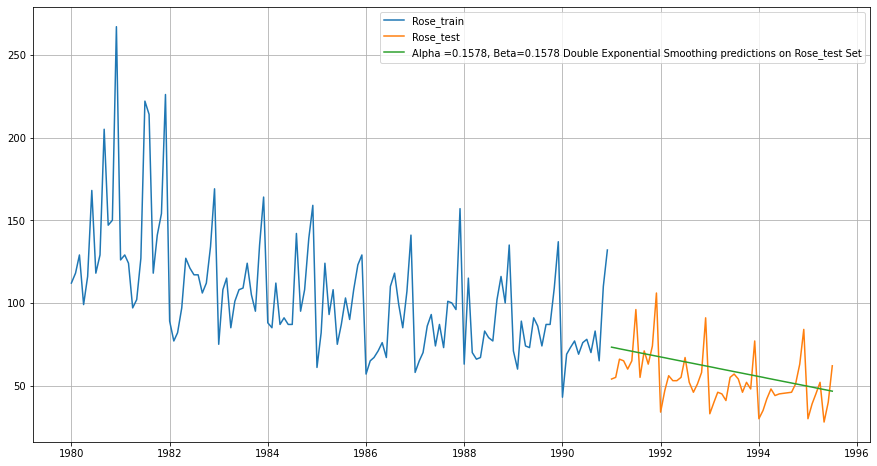

In [100]:
## Plotting on both the Rose_training and Rose_test data

plt.figure(figsize=(15,8))
plt.plot(DES_Rose_train['Rose'], label='Rose_train')
plt.plot(DES_Rose_test['Rose'], label='Rose_test')
plt.plot(DES_Rose_test['predict'], label='Alpha =0.1578, Beta=0.1578 Double Exponential Smoothing predictions on Rose_test Set')
plt.legend(loc='best')
plt.grid()


In [101]:
rmse_model7_Rose_test_1 = metrics.mean_squared_error(DES_Rose_test['Rose'],DES_Rose_test['predict'],squared=False)
print("For Alpha =0.1578, Beta=0.1578 Double Exponential Smoothing Model forecast on the Rose_test Data, RMSE is %3.3f" %(rmse_model7_Rose_test_1))

For Alpha =0.1578, Beta=0.1578 Double Exponential Smoothing Model forecast on the Rose_test Data, RMSE is 15.707


In [102]:
results_RoseDf_7 = pd.DataFrame({'Rose_test RMSE': [rmse_model7_Rose_test_1]},index=['Alpha =0.1578,Beta=0.1578,DoubleExponentialSmoothing'])

results_RoseDf = pd.concat([results_RoseDf, results_RoseDf_7])
results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570
2point_MovingAverage_Rose,68.970159
4point_MovingAverage_Rose,46.403626
6point_MovingAverage_Rose,39.126446
9point_MovingAverage_Rose,34.410938
"Alpha=0.0987,SimpleExponentialSmoothing",36.796227
"Alpha=0.10,SimpleExponentialSmoothing",36.828033
"Alpha =0.1578,Beta=0.1578,DoubleExponentialSmoothing",15.707052


In [103]:
results_RoseDf_7_1 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Rose_train RMSE':[],'Rose_test RMSE': []})
results_RoseDf_7_1

,Alpha Values,Beta Values,Rose_train RMSE,Rose_test RMSE


In [104]:
for i in np.arange(0.05,1.05,0.05):
    for j in np.arange(0.05,1.05,0.05):
        model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
        DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
        DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
        
        rmse_model6_Rose_train = metrics.mean_squared_error(DES_Rose_train['Rose'],DES_Rose_train['predict',i,j],squared=False)
        
        rmse_model6_Rose_test = metrics.mean_squared_error(DES_Rose_test['Rose'],DES_Rose_test['predict',i,j],squared=False)
        
        results_RoseDf_7_1 = results_RoseDf_7_1.append({'Alpha Values':i,'Beta Values':j,'Rose_train RMSE':rmse_model6_Rose_train
                                          ,'Rose_test RMSE':rmse_model6_Rose_test}, ignore_index=True)

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Ro

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Ro

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Ro

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWar

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Ro

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWar

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Ro

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Ro

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWar

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWar

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Ro

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWar

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWar

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Ro

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Ro

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWar

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWar

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWar

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWar

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-f

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_test['predict',i,j] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:3: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=i,smoothing_slope=j,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',i,j] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1522050955.py:5: PerformanceWar

In [105]:
results_RoseDf_7_1

,Alpha Values,Beta Values,Rose_train RMSE,Rose_test RMSE
0,0.05,0.05,49.734056,31.526909
1,0.05,0.10,42.089518,34.791317
2,0.05,0.15,39.106563,23.716964
3,0.05,0.20,37.692373,37.795490
4,0.05,0.25,37.009649,33.598511
...,...,...,...,...
395,1.00,0.80,57.365879,853.965537
396,1.00,0.85,58.887365,848.483485
397,1.00,0.90,60.474309,834.710935
398,1.00,0.95,62.133606,812.112950


In [106]:
results_RoseDf_7_1.sort_values(by=['Rose_test RMSE']).head()

,Alpha Values,Beta Values,Rose_train RMSE,Rose_test RMSE
6,0.05,0.35,36.233997,16.329097
5,0.05,0.30,36.616877,18.624638
2,0.05,0.15,39.106563,23.716964
0,0.05,0.05,49.734056,31.526909
7,0.05,0.40,35.783737,31.578177


In [107]:
model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=0.05,smoothing_slope=0.35,optimized=False,use_brute=True)
DES_Rose_train['predict',0.05,0.35] = model_DES_Rose_alpha_i_j.fittedvalues
DES_Rose_test['predict',0.05,0.35] = model_DES_Rose_alpha_i_j.forecast(steps=len(Rose_test))

C:\Users\User\AppData\Local\Temp/ipykernel_7092/3155388852.py:1: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_DES_Rose_alpha_i_j = model_DES_Rose.fit(smoothing_level=0.05,smoothing_slope=0.35,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/3155388852.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  DES_Rose_train['predict',0.05,0.35] = model_DES_Rose_alpha_i_j.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/3155388852.py:3: Pe

In [108]:
results_RoseDf_7_10=results_RoseDf_7_1.sort_values(by=['Rose_test RMSE'])
results_RoseDf_7_10.head()

,Alpha Values,Beta Values,Rose_train RMSE,Rose_test RMSE
6,0.05,0.35,36.233997,16.329097
5,0.05,0.30,36.616877,18.624638
2,0.05,0.15,39.106563,23.716964
0,0.05,0.05,49.734056,31.526909
7,0.05,0.40,35.783737,31.578177


In [109]:
Lowest_Test_RMSE=results_RoseDf_7_10.iloc[0,3]

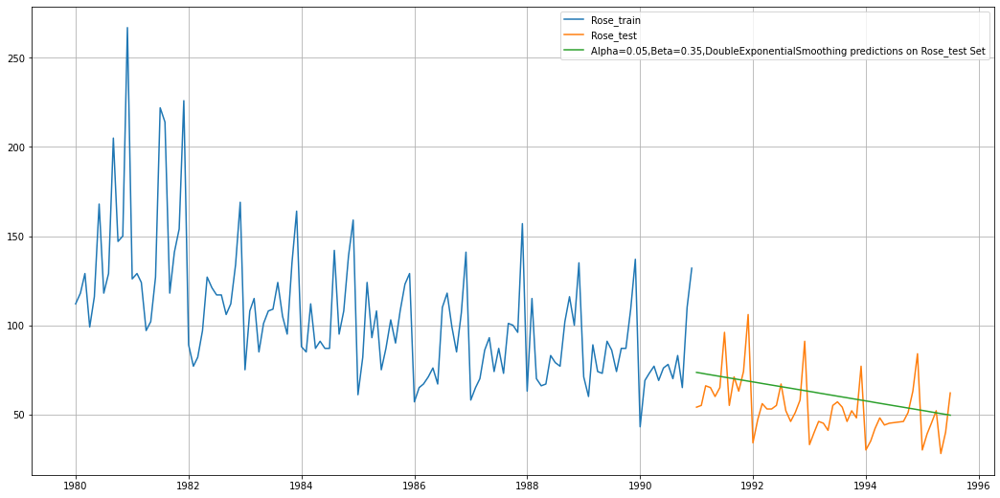

In [110]:
## Plotting on both the Rose_training and Rose_test data

plt.figure(figsize=(18,9))
plt.plot(DES_Rose_train['Rose'], label='Rose_train')
plt.plot(DES_Rose_test['Rose'], label='Rose_test')

plt.plot(DES_Rose_test['predict',0.05,0.35],label='Alpha=0.05,Beta=0.35,DoubleExponentialSmoothing predictions on Rose_test Set')


plt.legend(loc='best')
plt.grid();

In [111]:
results_RoseDf_7_1 = pd.DataFrame({'Rose_test RMSE': [results_RoseDf_7_1.sort_values(by=['Rose_test RMSE']).values[0][3]]}
                           ,index=['Alpha=0.05,Beta=0.35,DoubleExponentialSmoothing'])

results_RoseDf = pd.concat([results_RoseDf, results_RoseDf_7_1])
results_RoseDf


,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570
2point_MovingAverage_Rose,68.970159
4point_MovingAverage_Rose,46.403626
6point_MovingAverage_Rose,39.126446
9point_MovingAverage_Rose,34.410938
"Alpha=0.0987,SimpleExponentialSmoothing",36.796227
"Alpha=0.10,SimpleExponentialSmoothing",36.828033
"Alpha =0.1578,Beta=0.1578,DoubleExponentialSmoothing",15.707052


# Model 7: triple Exponentional Smoothing

In [112]:
TES_Rose_train = Rose_train.copy()
TES_Rose_test = Rose_test.copy()

In [113]:
model_TES_Rose = ExponentialSmoothing(TES_Rose_train['Rose'],trend='additive',seasonal='additive')

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [114]:
model_TES_Rose_autofit = model_TES_Rose.fit()

In [115]:
model_TES_Rose_autofit.params

{'smoothing_level': 0.08485622209289158,
 'smoothing_trend': 0.0005280630369796539,
 'smoothing_seasonal': 0.006764526794519119,
 'damping_trend': nan,
 'initial_level': 77.31958915163194,
 'initial_trend': -0.5501794952033382,
 'initial_seasons': array([ 38.63205024,  50.94041582,  59.06227683,  48.26306762,
         57.05566819,  62.6629802 ,  72.54958097,  78.56552615,
         74.62626287,  72.65336605,  90.54607132, 133.36580632]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [116]:
TES_Rose_test['auto_predict'] = model_TES_Rose_autofit.forecast(steps=len(Rose_test))
TES_Rose_test.head()

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


,Rose,auto_predict
YearMonth,,
1991-01-01,54.0,42.605820
1991-02-01,55.0,54.376558
1991-03-01,66.0,61.934184
1991-04-01,65.0,50.608812
1991-05-01,60.0,58.838643


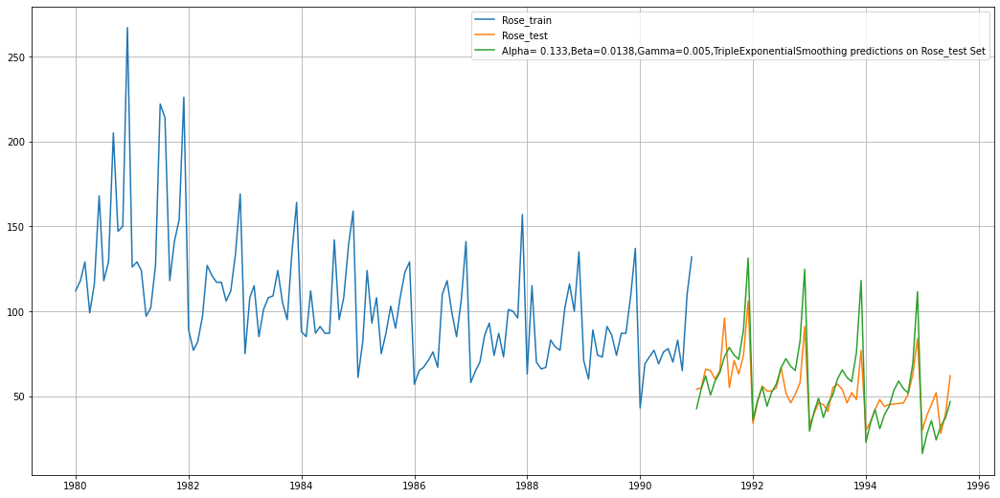

In [117]:
## Plotting on both the Rose_training and Rose_test using autofit

plt.figure(figsize=(18,9))
plt.plot(TES_Rose_train['Rose'], label='Rose_train')
plt.plot(TES_Rose_test['Rose'], label='Rose_test')

plt.plot(TES_Rose_test['auto_predict'], label='Alpha= 0.133,Beta=0.0138,Gamma=0.005,TripleExponentialSmoothing predictions on Rose_test Set')


plt.legend(loc='best')
plt.grid();

In [118]:
rmse_model6_Rose_test_1 = metrics.mean_squared_error(TES_Rose_test['Rose'],TES_Rose_test['auto_predict'],squared=False)
print("Alpha= 0.133,Beta=0.0138,Gamma=0.005, Triple Exponential Smoothing Model forecast on the Rose_test Data,  RMSE is %3.3f" %(rmse_model6_Rose_test_1))

Alpha= 0.133,Beta=0.0138,Gamma=0.005, Triple Exponential Smoothing Model forecast on the Rose_test Data,  RMSE is 14.257


In [119]:
results_RoseDf_8_1 = pd.DataFrame({'Rose_test RMSE': [rmse_model6_Rose_test_1]}
                           ,index=['Alpha= 0.133,Beta=0.0138,Gamma=0.005,TripleExponentialSmoothing'])

results_RoseDf = pd.concat([results_RoseDf, results_RoseDf_8_1])
results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570
2point_MovingAverage_Rose,68.970159
4point_MovingAverage_Rose,46.403626
6point_MovingAverage_Rose,39.126446
9point_MovingAverage_Rose,34.410938
"Alpha=0.0987,SimpleExponentialSmoothing",36.796227
"Alpha=0.10,SimpleExponentialSmoothing",36.828033
"Alpha =0.1578,Beta=0.1578,DoubleExponentialSmoothing",15.707052


In [120]:
results_RoseDf_8_2 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Rose_train RMSE':[],'Rose_test RMSE': []})
results_RoseDf_8_2

,Alpha Values,Beta Values,Gamma Values,Rose_train RMSE,Rose_test RMSE


In [121]:
for i in np.arange(0.05,1.05,0.05):
    for j in np.arange(0.05,1.05,0.05):
        for k in np.arange(0.05,1.05,0.05):
            model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
            TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
            TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
        
            rmse_model8_Rose_train = metrics.mean_squared_error(TES_Rose_train['Rose'],TES_Rose_train['predict',i,j,k],squared=False)
            
            rmse_model8_Rose_test = metrics.mean_squared_error(TES_Rose_test['Rose'],TES_Rose_test['predict',i,j,k],squared=False)
            
            results_RoseDf_8_2 = results_RoseDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
                                                  'Rose_train RMSE':rmse_model8_Rose_train,'Rose_test RMSE':rmse_model8_Rose_test}
                                                 , ignore_index=True)

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future v

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future v

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slo

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slo

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future v

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ip

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ip

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ip

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ip

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ip

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ip

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ip

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ip

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ip

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TE

C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_test['predict',i,j,k] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:4: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=i,smoothing_slope=j,smoothing_seasonal=k,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4241570081.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis

In [122]:
results_RoseDf_8_2.head()

,Alpha Values,Beta Values,Gamma Values,Rose_train RMSE,Rose_test RMSE
0,0.05,0.05,0.05,31.508794,28.819326
1,0.05,0.05,0.10,28.434484,23.763282
2,0.05,0.05,0.15,26.513593,21.173353
3,0.05,0.05,0.20,25.296330,19.743629
4,0.05,0.05,0.25,24.510726,18.846136


In [123]:
results_RoseDf_8_2.sort_values(by=['Rose_test RMSE']).head()

,Alpha Values,Beta Values,Gamma Values,Rose_train RMSE,Rose_test RMSE
347,0.05,0.90,0.40,26.036441,11.652209
366,0.05,0.95,0.35,26.257775,11.689432
328,0.05,0.85,0.45,25.896403,11.704586
309,0.05,0.80,0.50,25.820490,11.811688
146,0.05,0.40,0.35,24.528346,11.865056


In [124]:
model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=0.05,smoothing_slope=0.90,smoothing_seasonal=0.40,optimized=False,use_brute=True)
TES_Rose_train['predict',0.05,0.90,0.40] = model_TES_Rose_alpha_i_j_k.fittedvalues
TES_Rose_test['predict',0.05,0.90,0.40] = model_TES_Rose_alpha_i_j_k.forecast(steps=len(Rose_test))

C:\Users\User\AppData\Local\Temp/ipykernel_7092/1173837484.py:1: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  model_TES_Rose_alpha_i_j_k = model_TES_Rose.fit(smoothing_level=0.05,smoothing_slope=0.90,smoothing_seasonal=0.40,optimized=False,use_brute=True)
C:\Users\User\AppData\Local\Temp/ipykernel_7092/1173837484.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_Rose_train['predict',0.05,0.90,0.40] = model_TES_Rose_alpha_i_j_k.fittedvalues
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\Users\User\AppData\Local\Temp/i

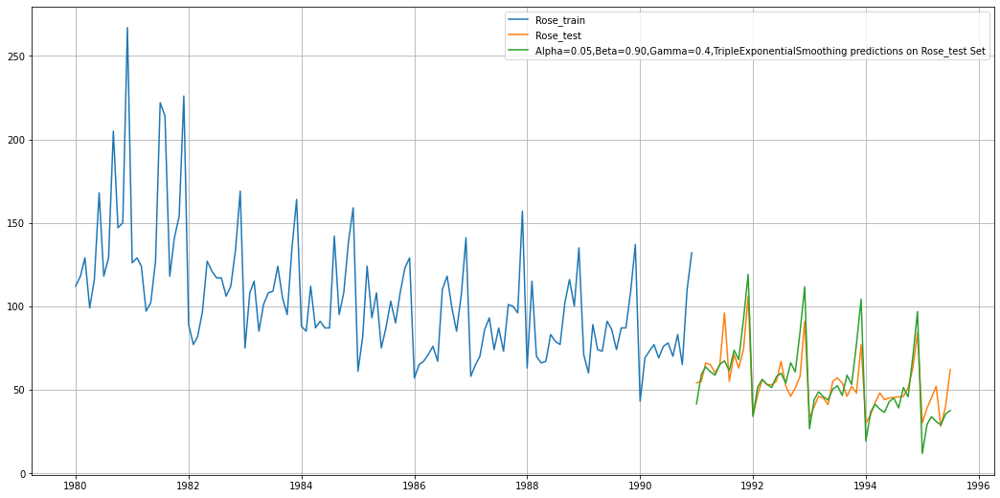

In [125]:
## Plotting on both the Rose_training and Rose_test data using brute force alpha, beta and gamma determination

plt.figure(figsize=(18,9))
plt.plot(TES_Rose_train['Rose'], label='Rose_train')
plt.plot(TES_Rose_test['Rose'], label='Rose_test')

#The value of alpha and beta is taken like that by python
plt.plot(TES_Rose_test['predict',0.05,0.90,0.40], label='Alpha=0.05,Beta=0.90,Gamma=0.4,TripleExponentialSmoothing predictions on Rose_test Set')


plt.legend(loc='best')
plt.grid();

In [126]:
results_RoseDf_8_3 = pd.DataFrame({'Rose_test RMSE': [results_RoseDf_8_2.sort_values(by=['Rose_test RMSE']).values[0][4]]}
                           ,index=['Alpha=0.05,Beta=0.90,Gamma=0.4,TripleExponentialSmoothing'])

results_RoseDf = pd.concat([results_RoseDf, results_RoseDf_8_3])
results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570
2point_MovingAverage_Rose,68.970159
4point_MovingAverage_Rose,46.403626
6point_MovingAverage_Rose,39.126446
9point_MovingAverage_Rose,34.410938
"Alpha=0.0987,SimpleExponentialSmoothing",36.796227
"Alpha=0.10,SimpleExponentialSmoothing",36.828033
"Alpha =0.1578,Beta=0.1578,DoubleExponentialSmoothing",15.707052


We see that the best model is the Triple Exponential Smoothing with multiplicative seasonality with the parameters  𝛼  = 0.05,  𝛽  = 0.90 and  𝛾  = 0.40.

# Question 5

# Check for the stationarity of the data on which the model is being built on using appropriate statistical tests and also mention the hypothesis for the statistical test. If the data is found to be non-stationary, take appropriate steps to make it stationary. Check the new data for stationarity and comment. Note: Stationarity should be checked at alpha = 0.05.

Null hypothesis - Data is non stationary

Alternate Hypothesis - Data is stationary

alpha - 0.05

If value of p comes out to be less than 0.05, then we reject null hypothesis

# testing stationary on whole data

In [127]:
from statsmodels.tsa.stattools import adfuller
def Rose_test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=5).mean() #determining the rolling mean
    rolstd = timeseries.rolling(window=5).std()   #determining the rolling standard deviation

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller Rose_test:
    print ('Results of Dickey-Fuller Rose_test:')
    dfRose_test = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dfRose_test[0:4], index=['Rose_test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dfRose_test[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

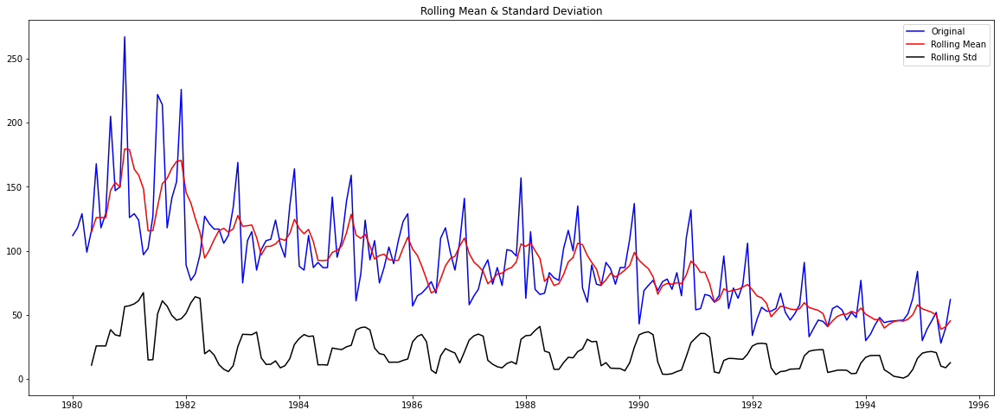

Results of Dickey-Fuller Rose_test:
Rose_test Statistic             -1.876699
p-value                          0.343101
#Lags Used                      13.000000
Number of Observations Used    173.000000
Critical Value (1%)             -3.468726
Critical Value (5%)             -2.878396
Critical Value (10%)            -2.575756
dtype: float64 



In [128]:
Rose_test_stationarity(Rose['Rose'])

5% significant level the time series is not stationary

take a difference of order 1 and check the time series is stationary or not

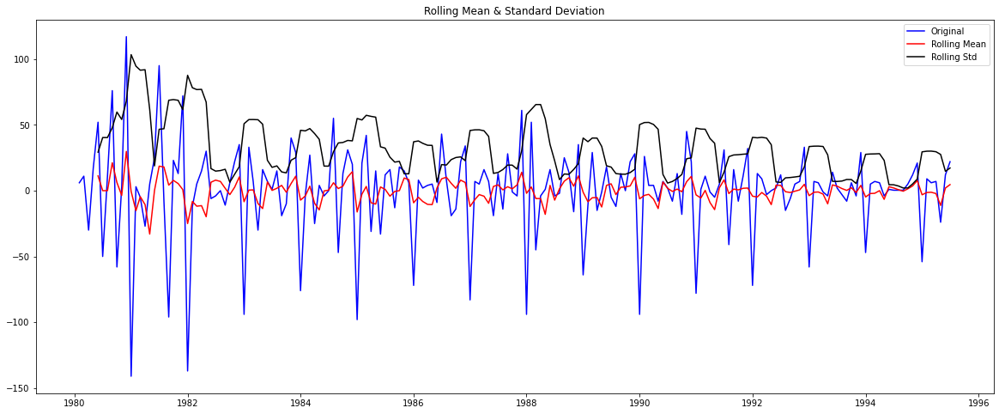

Results of Dickey-Fuller Rose_test:
Rose_test Statistic           -8.044392e+00
p-value                        1.810895e-12
#Lags Used                     1.200000e+01
Number of Observations Used    1.730000e+02
Critical Value (1%)           -3.468726e+00
Critical Value (5%)           -2.878396e+00
Critical Value (10%)          -2.575756e+00
dtype: float64 



In [129]:
Rose_test_stationarity(Rose['Rose'].diff().dropna())

we see that alpha=5% the ts is indeed stationary

# now we will plot the autocorrelation and partial autocorrelation data

In [130]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

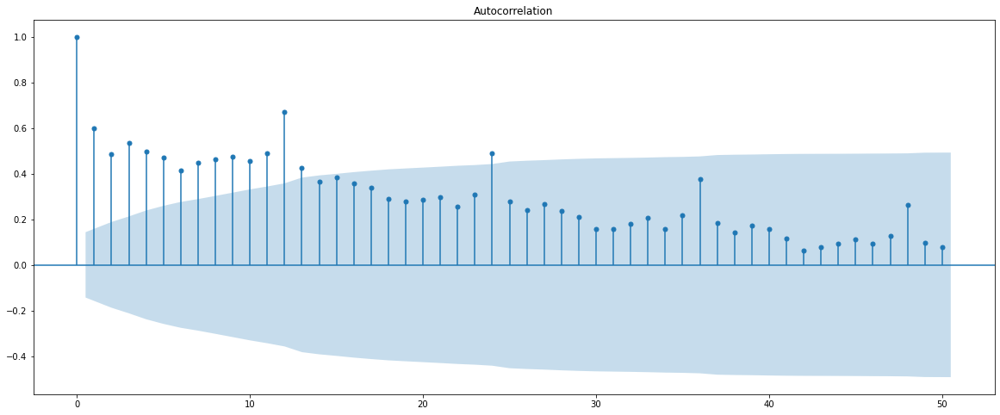

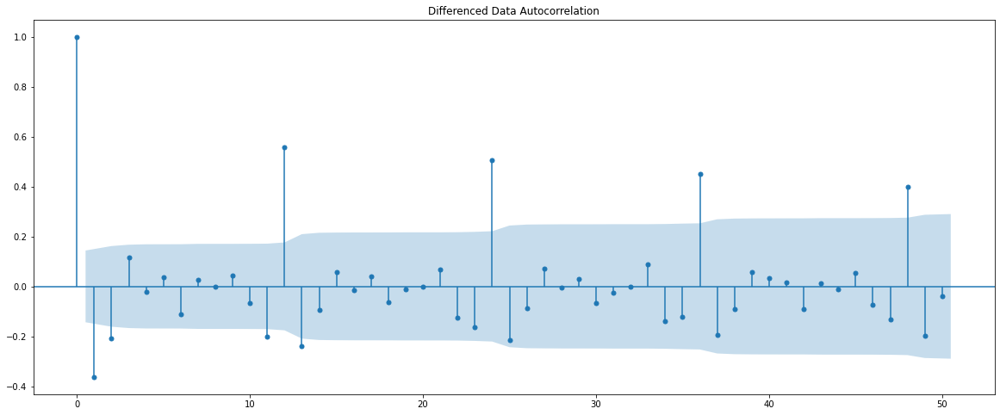

In [131]:
plot_acf(Rose['Rose'],lags=50)
plot_acf(Rose['Rose'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plt.show()

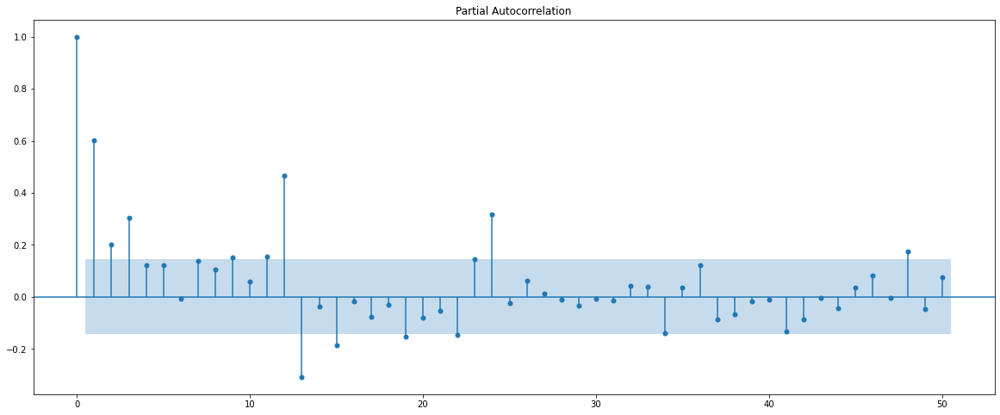

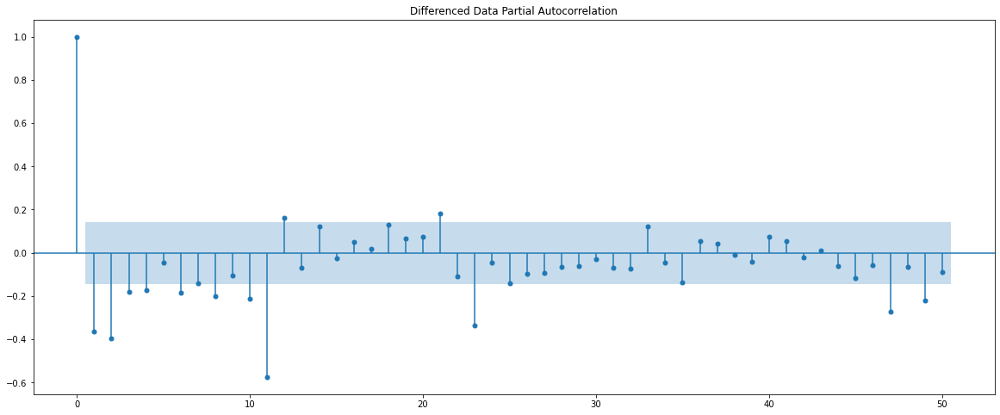

In [132]:
plot_pacf(Rose['Rose'],lags=50)
plot_pacf(Rose['Rose'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.show()

# check for stationary of the rose training data time series

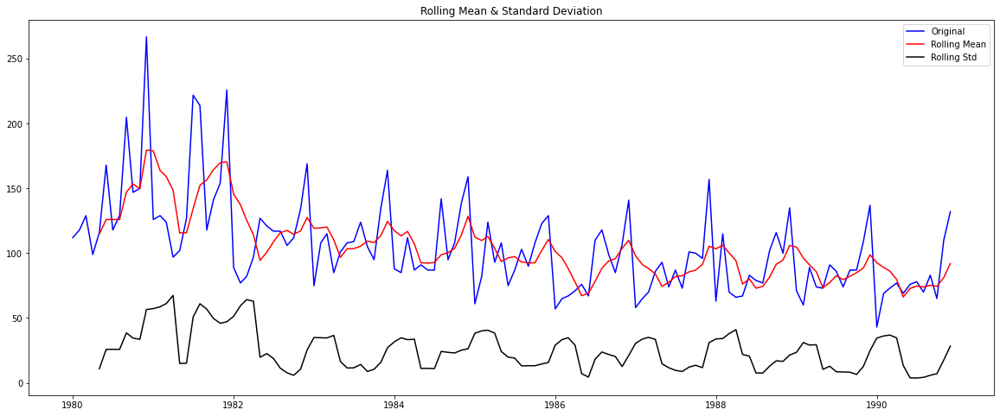

Results of Dickey-Fuller Rose_test:
Rose_test Statistic             -2.164250
p-value                          0.219476
#Lags Used                      13.000000
Number of Observations Used    118.000000
Critical Value (1%)             -3.487022
Critical Value (5%)             -2.886363
Critical Value (10%)            -2.580009
dtype: float64 



In [133]:
Rose_test_stationarity(Rose_train['Rose'])

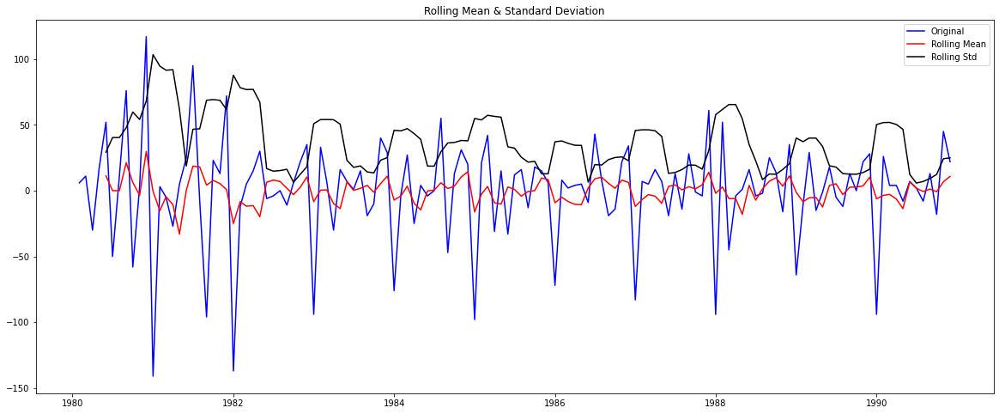

Results of Dickey-Fuller Rose_test:
Rose_test Statistic           -6.592372e+00
p-value                        7.061944e-09
#Lags Used                     1.200000e+01
Number of Observations Used    1.180000e+02
Critical Value (1%)           -3.487022e+00
Critical Value (5%)           -2.886363e+00
Critical Value (10%)          -2.580009e+00
dtype: float64 



In [134]:
Rose_test_stationarity(Rose_train['Rose'].diff().dropna())

after taking the difference in order 1 we see that the series have became stationary

# Question 6

# Build an automated version of the ARIMA/SARIMA model in which the parameters are selected using the lowest Akaike Information Criteria (AIC) on the training data and evaluate this model on the test data using RMSE.

In [135]:
import itertools
p = q = range(0, 4)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)


In [136]:
Rose_ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
Rose_ARIMA_AIC

,param,AIC


In [137]:
from statsmodels.tsa.arima_model import ARIMA

for param in pdq:
    ARIMA_model = ARIMA(Rose_train['Rose'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_model.aic))
    Rose_ARIMA_AIC = Rose_ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


ARIMA(0, 1, 0) - AIC:1335.1526583086775
ARIMA(0, 1, 1) - AIC:1280.726183046448
ARIMA(0, 1, 2) - AIC:1276.8353734911866
ARIMA(0, 1, 3) - AIC:1278.0742599150858
ARIMA(1, 1, 0) - AIC:1319.3483105802602
ARIMA(1, 1, 1) - AIC:1277.775753553521
ARIMA(1, 1, 2) - AIC:1277.3592281129256
ARIMA(1, 1, 3) - AIC:1279.312639992571
ARIMA(2, 1, 0) - AIC:1300.6092611744193
ARIMA(2, 1, 1) - AIC:1279.0456894093354
ARIMA(2, 1, 2) - AIC:1279.2986939365205
ARIMA(2, 1, 3) - AIC:1281.1962260431185
ARIMA(3, 1, 0) - AIC:1299.4787391543089
ARIMA(3, 1, 1) - AIC:1279.6059618578536
ARIMA(3, 1, 2) - AIC:1280.96924676004
ARIMA(3, 1, 3) - AIC:1273.1940974617016


In [138]:
Rose_ARIMA_AIC.sort_values(by='AIC',ascending=True)

,param,AIC
15,"(3, 1, 3)",1273.194097
2,"(0, 1, 2)",1276.835373
6,"(1, 1, 2)",1277.359228
5,"(1, 1, 1)",1277.775754
3,"(0, 1, 3)",1278.074260
9,"(2, 1, 1)",1279.045689
10,"(2, 1, 2)",1279.298694
7,"(1, 1, 3)",1279.312640
13,"(3, 1, 1)",1279.605962
1,"(0, 1, 1)",1280.726183


In [139]:
Rose_Auto_ARIMA = ARIMA(Rose_train['Rose'], order=(3,1,3))

results_Rose_Auto_ARIMA = Rose_Auto_ARIMA.fit()

print(results_Rose_Auto_ARIMA.summary())

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will

                             ARIMA Model Results                              
Dep. Variable:                 D.Rose   No. Observations:                  131
Model:                 ARIMA(3, 1, 3)   Log Likelihood                -628.597
Method:                       css-mle   S.D. of innovations             28.356
Date:                Sun, 17 Apr 2022   AIC                           1273.194
Time:                        19:05:50   BIC                           1296.196
Sample:                    02-01-1980   HQIC                          1282.541
                         - 12-01-1990                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -0.4906      0.088     -5.548      0.000      -0.664      -0.317
ar.L1.D.Rose    -0.7243      0.086     -8.411      0.000      -0.893      -0.556
ar.L2.D.Rose    -0.7218      0.087     -8.34

# Predict on the Rose_test Set using this model and evaluate the model.

In [140]:
predicted_Rose_Auto_ARIMA = results_Rose_Auto_ARIMA.forecast(steps=len(Rose_test))

In [141]:
from sklearn.metrics import  mean_squared_error
rmse = mean_squared_error(Rose_test['Rose'],predicted_Rose_Auto_ARIMA[0],squared=False)
print(rmse)

15.986441154283346


In [142]:
results_RoseDf9 = pd.DataFrame({'Rose_test RMSE': [rmse]}
                           ,index=['ARIMA(3,1,3)'])

results_RoseDf9

,Rose_test RMSE
"ARIMA(3,1,3)",15.986441


In [143]:
results_RoseDf = pd.concat([results_RoseDf, results_RoseDf9])
results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570
2point_MovingAverage_Rose,68.970159
4point_MovingAverage_Rose,46.403626
6point_MovingAverage_Rose,39.126446
9point_MovingAverage_Rose,34.410938
"Alpha=0.0987,SimpleExponentialSmoothing",36.796227
"Alpha=0.10,SimpleExponentialSmoothing",36.828033
"Alpha =0.1578,Beta=0.1578,DoubleExponentialSmoothing",15.707052


# Automated version of sarima  with lowest akaike information crieteria (AIC)

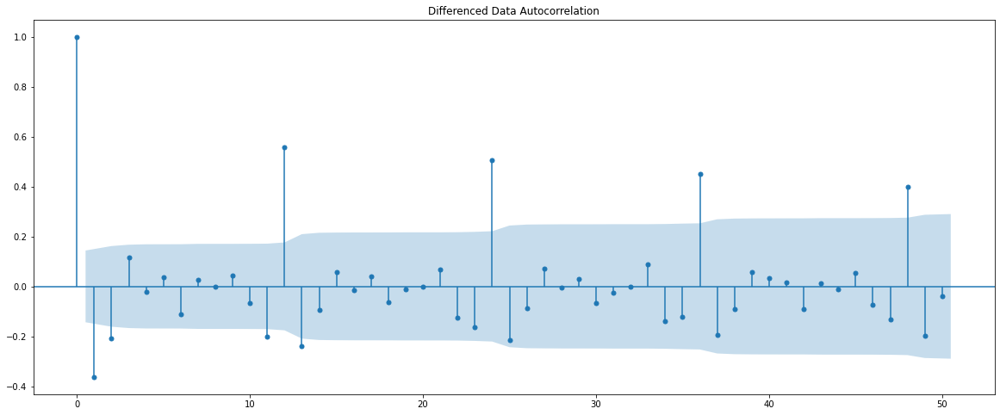

In [144]:
plot_acf(Rose['Rose'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plt.show()

# we see the seasonality of 6 and 12 

In [145]:
import itertools
p = q = range(0, 4)
d= range(1,2)
D = range(0,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 6) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 0, 1, 6)
Model: (0, 1, 2)(0, 0, 2, 6)
Model: (0, 1, 3)(0, 0, 3, 6)
Model: (1, 1, 0)(0, 1, 0, 6)
Model: (1, 1, 1)(0, 1, 1, 6)
Model: (1, 1, 2)(0, 1, 2, 6)
Model: (1, 1, 3)(0, 1, 3, 6)
Model: (2, 1, 0)(1, 0, 0, 6)
Model: (2, 1, 1)(1, 0, 1, 6)
Model: (2, 1, 2)(1, 0, 2, 6)
Model: (2, 1, 3)(1, 0, 3, 6)
Model: (3, 1, 0)(1, 1, 0, 6)
Model: (3, 1, 1)(1, 1, 1, 6)
Model: (3, 1, 2)(1, 1, 2, 6)
Model: (3, 1, 3)(1, 1, 3, 6)


In [146]:
Rose_SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
Rose_SARIMA_AIC

,param,seasonal,AIC


In [147]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model = sm.tsa.statespace.SARIMAX(Rose_train['Rose'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_Rose_SARIMA = SARIMA_model.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_Rose_SARIMA.aic))
        Rose_SARIMA_AIC = Rose_SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_Rose_SARIMA.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 6) - AIC:1323.9657875279158
SARIMA(0, 1, 0)x(0, 0, 1, 6) - AIC:1264.4996261113859
SARIMA(0, 1, 0)x(0, 0, 2, 6) - AIC:1144.7077471827401
SARIMA(0, 1, 0)x(0, 0, 3, 6) - AIC:1081.2713830625194
SARIMA(0, 1, 0)x(0, 1, 0, 6) - AIC:1362.6525264429365
SARIMA(0, 1, 0)x(0, 1, 1, 6) - AIC:1185.4374421231744
SARIMA(0, 1, 0)x(0, 1, 2, 6) - AIC:1085.222176554119
SARIMA(0, 1, 0)x(0, 1, 3, 6) - AIC:990.5887854030029
SARIMA(0, 1, 0)x(1, 0, 0, 6) - AIC:1274.7897737087985
SARIMA(0, 1, 0)x(1, 0, 1, 6) - AIC:1241.7870945149145
SARIMA(0, 1, 0)x(1, 0, 2, 6) - AIC:1146.309326672227
SARIMA(0, 1, 0)x(1, 0, 3, 6) - AIC:1058.9861743124334
SARIMA(0, 1, 0)x(1, 1, 0, 6) - AIC:1170.9535453581288
SARIMA(0, 1, 0)x(1, 1, 1, 6) - AIC:1159.57330556241
SARIMA(0, 1, 0)x(1, 1, 2, 6) - AIC:1055.7799643055246
SARIMA(0, 1, 0)x(1, 1, 3, 6) - AIC:966.9177276446221
SARIMA(0, 1, 0)x(2, 0, 0, 6) - AIC:1137.9167236212038
SARIMA(0, 1, 0)x(2, 0, 1, 6) - AIC:1137.4533629515201
SARIMA(0, 1, 0)x(2, 0, 2, 6) - AIC

SARIMA(1, 1, 0)x(3, 0, 2, 6) - AIC:1048.238852775517
SARIMA(1, 1, 0)x(3, 0, 3, 6) - AIC:1044.9201178331505
SARIMA(1, 1, 0)x(3, 1, 0, 6) - AIC:952.4151835418038
SARIMA(1, 1, 0)x(3, 1, 1, 6) - AIC:952.7401008053646
SARIMA(1, 1, 0)x(3, 1, 2, 6) - AIC:954.4244420014954
SARIMA(1, 1, 0)x(3, 1, 3, 6) - AIC:951.7117032868952
SARIMA(1, 1, 1)x(0, 0, 0, 6) - AIC:1262.1840064255505
SARIMA(1, 1, 1)x(0, 0, 1, 6) - AIC:1201.5037144424418
SARIMA(1, 1, 1)x(0, 0, 2, 6) - AIC:1093.6044317606352
SARIMA(1, 1, 1)x(0, 0, 3, 6) - AIC:1016.7345933690776
SARIMA(1, 1, 1)x(0, 1, 0, 6) - AIC:1300.0001789290018
SARIMA(1, 1, 1)x(0, 1, 1, 6) - AIC:1129.4520794991433
SARIMA(1, 1, 1)x(0, 1, 2, 6) - AIC:1019.1406742828867
SARIMA(1, 1, 1)x(0, 1, 3, 6) - AIC:943.7006704039392
SARIMA(1, 1, 1)x(1, 0, 0, 6) - AIC:1213.6233143130933
SARIMA(1, 1, 1)x(1, 0, 1, 6) - AIC:1162.424000437885
SARIMA(1, 1, 1)x(1, 0, 2, 6) - AIC:1083.258583438366
SARIMA(1, 1, 1)x(1, 0, 3, 6) - AIC:1003.9567058450393
SARIMA(1, 1, 1)x(1, 1, 0, 6) - AIC:1

SARIMA(2, 1, 1)x(2, 1, 0, 6) - AIC:996.5671248716222
SARIMA(2, 1, 1)x(2, 1, 1, 6) - AIC:989.8750414464076
SARIMA(2, 1, 1)x(2, 1, 2, 6) - AIC:968.5764361256219
SARIMA(2, 1, 1)x(2, 1, 3, 6) - AIC:924.3635459844868
SARIMA(2, 1, 1)x(3, 0, 0, 6) - AIC:974.1258778648452
SARIMA(2, 1, 1)x(3, 0, 1, 6) - AIC:975.8068385701052
SARIMA(2, 1, 1)x(3, 0, 2, 6) - AIC:967.6521337977802
SARIMA(2, 1, 1)x(3, 0, 3, 6) - AIC:967.1740913829686
SARIMA(2, 1, 1)x(3, 1, 0, 6) - AIC:914.9052783873492
SARIMA(2, 1, 1)x(3, 1, 1, 6) - AIC:916.8748001677476
SARIMA(2, 1, 1)x(3, 1, 2, 6) - AIC:922.6244082364544
SARIMA(2, 1, 1)x(3, 1, 3, 6) - AIC:926.3191556946405
SARIMA(2, 1, 2)x(0, 0, 0, 6) - AIC:1253.9102116146685
SARIMA(2, 1, 2)x(0, 0, 1, 6) - AIC:1185.7691921440698
SARIMA(2, 1, 2)x(0, 0, 2, 6) - AIC:1082.5581033340168
SARIMA(2, 1, 2)x(0, 0, 3, 6) - AIC:1005.4894643085994
SARIMA(2, 1, 2)x(0, 1, 0, 6) - AIC:1278.739038663575
SARIMA(2, 1, 2)x(0, 1, 1, 6) - AIC:1116.9299065777116
SARIMA(2, 1, 2)x(0, 1, 2, 6) - AIC:1011.1

SARIMA(3, 1, 2)x(1, 1, 2, 6) - AIC:959.6222379297021
SARIMA(3, 1, 2)x(1, 1, 3, 6) - AIC:914.6189037105555
SARIMA(3, 1, 2)x(2, 0, 0, 6) - AIC:1065.2478470030353
SARIMA(3, 1, 2)x(2, 0, 1, 6) - AIC:1055.8104649616403
SARIMA(3, 1, 2)x(2, 0, 2, 6) - AIC:1046.4200900194992
SARIMA(3, 1, 2)x(2, 0, 3, 6) - AIC:962.4545243894332
SARIMA(3, 1, 2)x(2, 1, 0, 6) - AIC:986.7121118151404
SARIMA(3, 1, 2)x(2, 1, 1, 6) - AIC:995.4463076259202
SARIMA(3, 1, 2)x(2, 1, 2, 6) - AIC:961.5196717504552
SARIMA(3, 1, 2)x(2, 1, 3, 6) - AIC:914.237394118966
SARIMA(3, 1, 2)x(3, 0, 0, 6) - AIC:963.444505323011
SARIMA(3, 1, 2)x(3, 0, 1, 6) - AIC:964.8545587845203
SARIMA(3, 1, 2)x(3, 0, 2, 6) - AIC:962.5692241018712
SARIMA(3, 1, 2)x(3, 0, 3, 6) - AIC:964.2706190054569
SARIMA(3, 1, 2)x(3, 1, 0, 6) - AIC:935.1519746067758
SARIMA(3, 1, 2)x(3, 1, 1, 6) - AIC:908.4349056701839
SARIMA(3, 1, 2)x(3, 1, 2, 6) - AIC:910.3777884884629
SARIMA(3, 1, 2)x(3, 1, 3, 6) - AIC:932.2558085791354
SARIMA(3, 1, 3)x(0, 0, 0, 6) - AIC:1243.73858

In [148]:
Rose_SARIMA_AIC.sort_values(by=['AIC']).head()

,param,seasonal,AIC
375,"(2, 1, 3)","(2, 1, 3, 6)",889.189817
503,"(3, 1, 3)","(2, 1, 3, 6)",891.125985
511,"(3, 1, 3)","(3, 1, 3, 6)",893.125640
367,"(2, 1, 3)","(1, 1, 3, 6)",894.757072
127,"(0, 1, 3)","(3, 1, 3, 6)",894.905687


In [149]:
import statsmodels.api as sm

auto_Rose_SARIMA_6 = sm.tsa.statespace.SARIMAX(Rose_train['Rose'].values,
                                order=(2, 1, 3),
                                seasonal_order=(2, 1, 3, 6),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_Rose_SARIMA_6 = auto_Rose_SARIMA_6.fit(maxiter=1000)
print(results_auto_Rose_SARIMA_6.summary())

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                  132
Model:             SARIMAX(2, 1, 3)x(2, 1, 3, 6)   Log Likelihood                -433.595
Date:                           Sun, 17 Apr 2022   AIC                            889.190
Time:                                   19:18:15   BIC                            918.172
Sample:                                        0   HQIC                           900.929
                                           - 132                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5746      0.023     25.067      0.000       0.530       0.620
ar.L2         -0.9162      0.021    -43.468

C:\Users\User\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


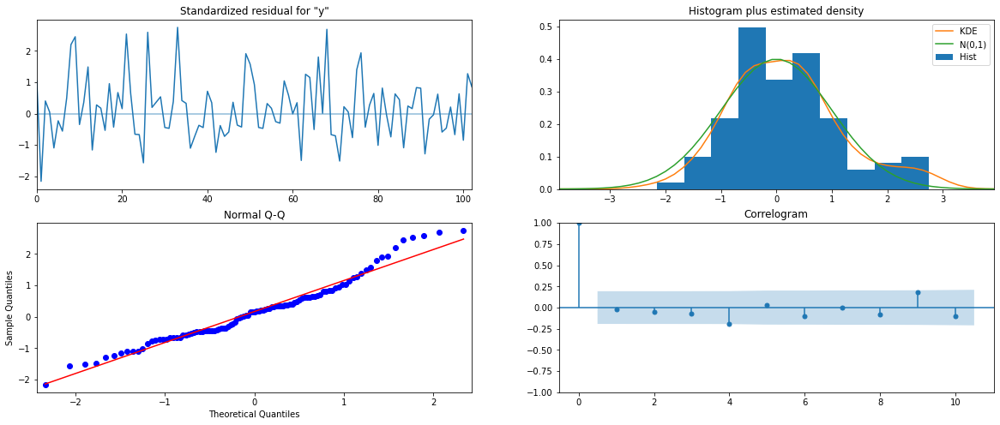

In [150]:
results_auto_Rose_SARIMA_6.plot_diagnostics()
plt.show()

# predict on the rose test set using this model and evaluate the model

In [151]:
predicted_auto_Rose_SARIMA_6 = results_auto_Rose_SARIMA_6.get_forecast(steps=len(Rose_test))

In [152]:
predicted_auto_Rose_SARIMA_6.summary_frame().head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,54.884819,15.046420,25.394377,84.375260
1,63.978125,15.158671,34.267676,93.688575
2,71.844534,15.456135,41.551066,102.138002
3,69.056538,15.808567,38.072317,100.040759
4,77.042959,15.994144,45.695012,108.390905


In [153]:
rmse = mean_squared_error(Rose_test['Rose'],predicted_auto_Rose_SARIMA_6.predicted_mean,squared=False)
print(rmse)

16.74614792145421


In [154]:
temp_results_RoseDf = pd.DataFrame({'Rose_test RMSE': [rmse]}
                           ,index=['SARIMA(2, 1, 3),(2, 1, 3, 6)'])


results_RoseDf = pd.concat([results_RoseDf,temp_results_RoseDf])

results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570
2point_MovingAverage_Rose,68.970159
4point_MovingAverage_Rose,46.403626
6point_MovingAverage_Rose,39.126446
9point_MovingAverage_Rose,34.410938
"Alpha=0.0987,SimpleExponentialSmoothing",36.796227
"Alpha=0.10,SimpleExponentialSmoothing",36.828033
"Alpha =0.1578,Beta=0.1578,DoubleExponentialSmoothing",15.707052


# setting the seasonality as 12

In [155]:
import itertools
p = q = range(0, 4)
d= range(1,2)
D = range(0,2)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (0, 1, 3)(0, 0, 3, 12)
Model: (1, 1, 0)(0, 1, 0, 12)
Model: (1, 1, 1)(0, 1, 1, 12)
Model: (1, 1, 2)(0, 1, 2, 12)
Model: (1, 1, 3)(0, 1, 3, 12)
Model: (2, 1, 0)(1, 0, 0, 12)
Model: (2, 1, 1)(1, 0, 1, 12)
Model: (2, 1, 2)(1, 0, 2, 12)
Model: (2, 1, 3)(1, 0, 3, 12)
Model: (3, 1, 0)(1, 1, 0, 12)
Model: (3, 1, 1)(1, 1, 1, 12)
Model: (3, 1, 2)(1, 1, 2, 12)
Model: (3, 1, 3)(1, 1, 3, 12)


In [156]:
Rose_SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
Rose_SARIMA_AIC

,param,seasonal,AIC


In [157]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model = sm.tsa.statespace.SARIMAX(Rose_train['Rose'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_Rose_SARIMA = SARIMA_model.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_Rose_SARIMA.aic))
        Rose_SARIMA_AIC = Rose_SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_Rose_SARIMA.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:1323.9657875279158
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:1145.4230827207175
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:976.4375296380894


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(0, 0, 3, 12) - AIC:5718.421796606624
SARIMA(0, 1, 0)x(0, 1, 0, 12) - AIC:1171.2013438279514
SARIMA(0, 1, 0)x(0, 1, 1, 12) - AIC:965.5057301644053
SARIMA(0, 1, 0)x(0, 1, 2, 12) - AIC:845.8687014775927


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(0, 1, 3, 12) - AIC:3052.0359387248423
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:1139.921738995602
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:1116.0207869386002
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:969.6913635753448
SARIMA(0, 1, 0)x(1, 0, 3, 12) - AIC:3923.111981743881
SARIMA(0, 1, 0)x(1, 1, 0, 12) - AIC:982.3269589658807
SARIMA(0, 1, 0)x(1, 1, 1, 12) - AIC:975.3375383601636
SARIMA(0, 1, 0)x(1, 1, 2, 12) - AIC:847.733218265492
SARIMA(0, 1, 0)x(1, 1, 3, 12) - AIC:2895.1724262597895


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:960.8812220353041
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:962.8794540697546
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:955.5735408945653


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(2, 0, 3, 12) - AIC:3735.47970250528
SARIMA(0, 1, 0)x(2, 1, 0, 12) - AIC:858.5132698374416
SARIMA(0, 1, 0)x(2, 1, 1, 12) - AIC:853.3390729144091
SARIMA(0, 1, 0)x(2, 1, 2, 12) - AIC:842.628224422131


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(2, 1, 3, 12) - AIC:3681.420918783187
SARIMA(0, 1, 0)x(3, 0, 0, 12) - AIC:850.753540393109
SARIMA(0, 1, 0)x(3, 0, 1, 12) - AIC:851.748270265051
SARIMA(0, 1, 0)x(3, 0, 2, 12) - AIC:850.5304136127558


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 0)x(3, 0, 3, 12) - AIC:3463.5988181011626
SARIMA(0, 1, 0)x(3, 1, 0, 12) - AIC:752.3958122739762
SARIMA(0, 1, 0)x(3, 1, 1, 12) - AIC:748.3165246490003
SARIMA(0, 1, 0)x(3, 1, 2, 12) - AIC:748.9721713370949
SARIMA(0, 1, 0)x(3, 1, 3, 12) - AIC:3042.79975487777
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:1263.5369097383964
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:1098.5554825918339
SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:923.631404938387


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(0, 0, 3, 12) - AIC:5697.443976122974
SARIMA(0, 1, 1)x(0, 1, 0, 12) - AIC:1113.7663133563728
SARIMA(0, 1, 1)x(0, 1, 1, 12) - AIC:915.073060671733
SARIMA(0, 1, 1)x(0, 1, 2, 12) - AIC:790.9032809266855


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(0, 1, 3, 12) - AIC:3832.5605955348988
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:1095.793632491795
SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:1054.743433094548
SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:918.8573483293343


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(1, 0, 3, 12) - AIC:3779.901223324475
SARIMA(0, 1, 1)x(1, 1, 0, 12) - AIC:944.2456655532176
SARIMA(0, 1, 1)x(1, 1, 1, 12) - AIC:929.3362488520044
SARIMA(0, 1, 1)x(1, 1, 2, 12) - AIC:792.7161670349237


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(1, 1, 3, 12) - AIC:2634.1802462871356
SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:914.5982866536075
SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:915.3332430461666
SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:901.1988256216015


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(2, 0, 3, 12) - AIC:3709.9417322302766
SARIMA(0, 1, 1)x(2, 1, 0, 12) - AIC:810.3194350158662
SARIMA(0, 1, 1)x(2, 1, 1, 12) - AIC:804.1555755139157
SARIMA(0, 1, 1)x(2, 1, 2, 12) - AIC:782.1538715246272
SARIMA(0, 1, 1)x(2, 1, 3, 12) - AIC:2840.1992609193303
SARIMA(0, 1, 1)x(3, 0, 0, 12) - AIC:798.588976478365
SARIMA(0, 1, 1)x(3, 0, 1, 12) - AIC:800.484493162141
SARIMA(0, 1, 1)x(3, 0, 2, 12) - AIC:801.0595269379617


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(3, 0, 3, 12) - AIC:3695.7078636456276
SARIMA(0, 1, 1)x(3, 1, 0, 12) - AIC:708.0834235838853
SARIMA(0, 1, 1)x(3, 1, 1, 12) - AIC:700.0095711665518
SARIMA(0, 1, 1)x(3, 1, 2, 12) - AIC:701.4835661806626


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 1)x(3, 1, 3, 12) - AIC:3090.7606053180048
SARIMA(0, 1, 2)x(0, 0, 0, 12) - AIC:1251.667543054104
SARIMA(0, 1, 2)x(0, 0, 1, 12) - AIC:1083.4866975264913
SARIMA(0, 1, 2)x(0, 0, 2, 12) - AIC:913.4938486617699


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(0, 0, 3, 12) - AIC:5274.882125362548
SARIMA(0, 1, 2)x(0, 1, 0, 12) - AIC:1098.6598024292612
SARIMA(0, 1, 2)x(0, 1, 1, 12) - AIC:904.5003488475932
SARIMA(0, 1, 2)x(0, 1, 2, 12) - AIC:784.0140955703721


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(0, 1, 3, 12) - AIC:2335.687005200989
SARIMA(0, 1, 2)x(1, 0, 0, 12) - AIC:1088.8332843413673
SARIMA(0, 1, 2)x(1, 0, 1, 12) - AIC:1045.540093355627
SARIMA(0, 1, 2)x(1, 0, 2, 12) - AIC:904.8310913581822


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(1, 0, 3, 12) - AIC:2500.5105450231245
SARIMA(0, 1, 2)x(1, 1, 0, 12) - AIC:941.5256923362788
SARIMA(0, 1, 2)x(1, 1, 1, 12) - AIC:915.273113409056
SARIMA(0, 1, 2)x(1, 1, 2, 12) - AIC:785.8237144293379


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(1, 1, 3, 12) - AIC:4887.494035117613
SARIMA(0, 1, 2)x(2, 0, 0, 12) - AIC:913.0105912257978
SARIMA(0, 1, 2)x(2, 0, 1, 12) - AIC:914.1707545034652
SARIMA(0, 1, 2)x(2, 0, 2, 12) - AIC:887.9375085679584


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(2, 0, 3, 12) - AIC:2563.981616133711
SARIMA(0, 1, 2)x(2, 1, 0, 12) - AIC:811.548943817834
SARIMA(0, 1, 2)x(2, 1, 1, 12) - AIC:805.1158488729624
SARIMA(0, 1, 2)x(2, 1, 2, 12) - AIC:774.9691222024106


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(2, 1, 3, 12) - AIC:3869.420754479312
SARIMA(0, 1, 2)x(3, 0, 0, 12) - AIC:800.1020189375205
SARIMA(0, 1, 2)x(3, 0, 1, 12) - AIC:801.9941080533189
SARIMA(0, 1, 2)x(3, 0, 2, 12) - AIC:802.520652826136


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(3, 0, 3, 12) - AIC:2666.3931438665522
SARIMA(0, 1, 2)x(3, 1, 0, 12) - AIC:709.6122118546598


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(3, 1, 1, 12) - AIC:701.7009897857963
SARIMA(0, 1, 2)x(3, 1, 2, 12) - AIC:703.394703197321


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 2)x(3, 1, 3, 12) - AIC:2264.9600669143606
SARIMA(0, 1, 3)x(0, 0, 0, 12) - AIC:1243.9501216739152
SARIMA(0, 1, 3)x(0, 0, 1, 12) - AIC:1076.7632646079987
SARIMA(0, 1, 3)x(0, 0, 2, 12) - AIC:905.6926533380713


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(0, 0, 3, 12) - AIC:5125.203630829177
SARIMA(0, 1, 3)x(0, 1, 0, 12) - AIC:1088.3764710136468
SARIMA(0, 1, 3)x(0, 1, 1, 12) - AIC:897.1317873892932
SARIMA(0, 1, 3)x(0, 1, 2, 12) - AIC:778.442756787046


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(0, 1, 3, 12) - AIC:3303.500508447761
SARIMA(0, 1, 3)x(1, 0, 0, 12) - AIC:1089.2051361212232
SARIMA(0, 1, 3)x(1, 0, 1, 12) - AIC:1034.8411212936157
SARIMA(0, 1, 3)x(1, 0, 2, 12) - AIC:896.8362523340468
SARIMA(0, 1, 3)x(1, 0, 3, 12) - AIC:3804.225429137994
SARIMA(0, 1, 3)x(1, 1, 0, 12) - AIC:943.5043088714341
SARIMA(0, 1, 3)x(1, 1, 1, 12) - AIC:904.9319970114595
SARIMA(0, 1, 3)x(1, 1, 2, 12) - AIC:780.2386079743551


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(1, 1, 3, 12) - AIC:1449.158869808335
SARIMA(0, 1, 3)x(2, 0, 0, 12) - AIC:914.9477108987096
SARIMA(0, 1, 3)x(2, 0, 1, 12) - AIC:916.0630996896724
SARIMA(0, 1, 3)x(2, 0, 2, 12) - AIC:880.5509788249415


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(2, 0, 3, 12) - AIC:3605.2986576627577
SARIMA(0, 1, 3)x(2, 1, 0, 12) - AIC:813.4051893208884
SARIMA(0, 1, 3)x(2, 1, 1, 12) - AIC:806.4667725192635
SARIMA(0, 1, 3)x(2, 1, 2, 12) - AIC:767.2243745963351


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(2, 1, 3, 12) - AIC:2121.7790442434693
SARIMA(0, 1, 3)x(3, 0, 0, 12) - AIC:802.0987124771223
SARIMA(0, 1, 3)x(3, 0, 1, 12) - AIC:803.9928772338811
SARIMA(0, 1, 3)x(3, 0, 2, 12) - AIC:804.5150752298563


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(0, 1, 3)x(3, 0, 3, 12) - AIC:3642.462844594013
SARIMA(0, 1, 3)x(3, 1, 0, 12) - AIC:711.7218300989923
SARIMA(0, 1, 3)x(3, 1, 1, 12) - AIC:703.6693125236384
SARIMA(0, 1, 3)x(3, 1, 2, 12) - AIC:705.3782299365675
SARIMA(0, 1, 3)x(3, 1, 3, 12) - AIC:1218.42631729265
SARIMA(1, 1, 0)x(0, 0, 0, 12) - AIC:1308.161871082466
SARIMA(1, 1, 0)x(0, 0, 1, 12) - AIC:1135.2955447585719
SARIMA(1, 1, 0)x(0, 0, 2, 12) - AIC:963.940539125769


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(0, 0, 3, 12) - AIC:5776.225563773753
SARIMA(1, 1, 0)x(0, 1, 0, 12) - AIC:1164.5103013842067
SARIMA(1, 1, 0)x(0, 1, 1, 12) - AIC:953.8813887547306
SARIMA(1, 1, 0)x(0, 1, 2, 12) - AIC:828.8398832821204


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(0, 1, 3, 12) - AIC:3524.453309412654
SARIMA(1, 1, 0)x(1, 0, 0, 12) - AIC:1124.886078680458
SARIMA(1, 1, 0)x(1, 0, 1, 12) - AIC:1105.4080055024756
SARIMA(1, 1, 0)x(1, 0, 2, 12) - AIC:958.5001972948193


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(1, 0, 3, 12) - AIC:3611.083522911877
SARIMA(1, 1, 0)x(1, 1, 0, 12) - AIC:962.9698535735688
SARIMA(1, 1, 0)x(1, 1, 1, 12) - AIC:964.8516934823627
SARIMA(1, 1, 0)x(1, 1, 2, 12) - AIC:830.307580496708


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(1, 1, 3, 12) - AIC:3287.6080033437206
SARIMA(1, 1, 0)x(2, 0, 0, 12) - AIC:939.0984778664119
SARIMA(1, 1, 0)x(2, 0, 1, 12) - AIC:940.9087133661067
SARIMA(1, 1, 0)x(2, 0, 2, 12) - AIC:942.2973103071328


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(2, 0, 3, 12) - AIC:3544.9005448954404
SARIMA(1, 1, 0)x(2, 1, 0, 12) - AIC:826.9995808091124
SARIMA(1, 1, 0)x(2, 1, 1, 12) - AIC:823.826110278099
SARIMA(1, 1, 0)x(2, 1, 2, 12) - AIC:825.0437253094386


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(2, 1, 3, 12) - AIC:2860.656003262067
SARIMA(1, 1, 0)x(3, 0, 0, 12) - AIC:819.3931032272586
SARIMA(1, 1, 0)x(3, 0, 1, 12) - AIC:821.1501371573468
SARIMA(1, 1, 0)x(3, 0, 2, 12) - AIC:819.1305086833714


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(3, 0, 3, 12) - AIC:3530.49919829007
SARIMA(1, 1, 0)x(3, 1, 0, 12) - AIC:727.3669084126892
SARIMA(1, 1, 0)x(3, 1, 1, 12) - AIC:728.9034690439004
SARIMA(1, 1, 0)x(3, 1, 2, 12) - AIC:721.9926144954649


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 0)x(3, 1, 3, 12) - AIC:3108.1695919517706
SARIMA(1, 1, 1)x(0, 0, 0, 12) - AIC:1262.1840064255505
SARIMA(1, 1, 1)x(0, 0, 1, 12) - AIC:1094.317270864085
SARIMA(1, 1, 1)x(0, 0, 2, 12) - AIC:923.086222406386


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(0, 0, 3, 12) - AIC:5143.155178182782
SARIMA(1, 1, 1)x(0, 1, 0, 12) - AIC:1110.6209464400317
SARIMA(1, 1, 1)x(0, 1, 1, 12) - AIC:914.0453844988074
SARIMA(1, 1, 1)x(0, 1, 2, 12) - AIC:792.3411370856571


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(0, 1, 3, 12) - AIC:3011.7202277302877
SARIMA(1, 1, 1)x(1, 0, 0, 12) - AIC:1083.3937965032806
SARIMA(1, 1, 1)x(1, 0, 1, 12) - AIC:1054.7180547135129
SARIMA(1, 1, 1)x(1, 0, 2, 12) - AIC:916.3549428503279
SARIMA(1, 1, 1)x(1, 0, 3, 12) - AIC:3885.4831308765374
SARIMA(1, 1, 1)x(1, 1, 0, 12) - AIC:933.297421682369
SARIMA(1, 1, 1)x(1, 1, 1, 12) - AIC:927.2920638200435
SARIMA(1, 1, 1)x(1, 1, 2, 12) - AIC:794.1929706683665


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(1, 1, 3, 12) - AIC:5672.098786983527
SARIMA(1, 1, 1)x(2, 0, 0, 12) - AIC:905.924906084468
SARIMA(1, 1, 1)x(2, 0, 1, 12) - AIC:907.2972867470745
SARIMA(1, 1, 1)x(2, 0, 2, 12) - AIC:900.672579593691
SARIMA(1, 1, 1)x(2, 0, 3, 12) - AIC:3815.529185431417
SARIMA(1, 1, 1)x(2, 1, 0, 12) - AIC:799.947425832107
SARIMA(1, 1, 1)x(2, 1, 1, 12) - AIC:791.9065436346552
SARIMA(1, 1, 1)x(2, 1, 2, 12) - AIC:783.8990952429712


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(2, 1, 3, 12) - AIC:2039.1304886694425
SARIMA(1, 1, 1)x(3, 0, 0, 12) - AIC:789.2360439386802
SARIMA(1, 1, 1)x(3, 0, 1, 12) - AIC:790.9603447855586
SARIMA(1, 1, 1)x(3, 0, 2, 12) - AIC:790.811385029159
SARIMA(1, 1, 1)x(3, 0, 3, 12) - AIC:3801.305225834893
SARIMA(1, 1, 1)x(3, 1, 0, 12) - AIC:702.1669810479294
SARIMA(1, 1, 1)x(3, 1, 1, 12) - AIC:693.9370840858745
SARIMA(1, 1, 1)x(3, 1, 2, 12) - AIC:695.0475216816036


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 1)x(3, 1, 3, 12) - AIC:83.68776710802283
SARIMA(1, 1, 2)x(0, 0, 0, 12) - AIC:1251.9495040706236
SARIMA(1, 1, 2)x(0, 0, 1, 12) - AIC:1085.4861928100865
SARIMA(1, 1, 2)x(0, 0, 2, 12) - AIC:915.493840271503


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(0, 0, 3, 12) - AIC:5691.958795261579
SARIMA(1, 1, 2)x(0, 1, 0, 12) - AIC:1096.3571024751675
SARIMA(1, 1, 2)x(0, 1, 1, 12) - AIC:906.4966907625364
SARIMA(1, 1, 2)x(0, 1, 2, 12) - AIC:785.9832738914134
SARIMA(1, 1, 2)x(0, 1, 3, 12) - AIC:3271.2957889786867
SARIMA(1, 1, 2)x(1, 0, 0, 12) - AIC:1090.7760922493494
SARIMA(1, 1, 2)x(1, 0, 1, 12) - AIC:1042.6183220083724
SARIMA(1, 1, 2)x(1, 0, 2, 12) - AIC:906.7318500508657


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(1, 0, 3, 12) - AIC:3771.2890404795453
SARIMA(1, 1, 2)x(1, 1, 0, 12) - AIC:934.8870392437676
SARIMA(1, 1, 2)x(1, 1, 1, 12) - AIC:917.2527818412017
SARIMA(1, 1, 2)x(1, 1, 2, 12) - AIC:787.784397022405


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(1, 1, 3, 12) - AIC:580.8143859420196
SARIMA(1, 1, 2)x(2, 0, 0, 12) - AIC:906.1690197403764
SARIMA(1, 1, 2)x(2, 0, 1, 12) - AIC:907.4597827986624
SARIMA(1, 1, 2)x(2, 0, 2, 12) - AIC:889.902849369327


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(2, 0, 3, 12) - AIC:3701.427574717762
SARIMA(1, 1, 2)x(2, 1, 0, 12) - AIC:801.9382052144458
SARIMA(1, 1, 2)x(2, 1, 1, 12) - AIC:791.9171161968218
SARIMA(1, 1, 2)x(2, 1, 2, 12) - AIC:776.9401083738287


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(2, 1, 3, 12) - AIC:18.0
SARIMA(1, 1, 2)x(3, 0, 0, 12) - AIC:791.007380246502
SARIMA(1, 1, 2)x(3, 0, 1, 12) - AIC:792.6312805560863
SARIMA(1, 1, 2)x(3, 0, 2, 12) - AIC:792.1390249251345


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(3, 0, 3, 12) - AIC:3688.8329148727094
SARIMA(1, 1, 2)x(3, 1, 0, 12) - AIC:703.8075522582235
SARIMA(1, 1, 2)x(3, 1, 1, 12) - AIC:696.1085407023899
SARIMA(1, 1, 2)x(3, 1, 2, 12) - AIC:697.2354764029221


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 2)x(3, 1, 3, 12) - AIC:487.6037099761237
SARIMA(1, 1, 3)x(0, 0, 0, 12) - AIC:1245.5463125316496
SARIMA(1, 1, 3)x(0, 0, 1, 12) - AIC:1072.984973917893
SARIMA(1, 1, 3)x(0, 0, 2, 12) - AIC:907.4130105124817


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(0, 0, 3, 12) - AIC:5542.087568167045
SARIMA(1, 1, 3)x(0, 1, 0, 12) - AIC:1088.0914860031187
SARIMA(1, 1, 3)x(0, 1, 1, 12) - AIC:895.9867971322674
SARIMA(1, 1, 3)x(0, 1, 2, 12) - AIC:780.3059561902656
SARIMA(1, 1, 3)x(0, 1, 3, 12) - AIC:3165.128909305182
SARIMA(1, 1, 3)x(1, 0, 0, 12) - AIC:1082.3281487676177
SARIMA(1, 1, 3)x(1, 0, 1, 12) - AIC:1036.1950927105722
SARIMA(1, 1, 3)x(1, 0, 2, 12) - AIC:897.5232291501883


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(1, 0, 3, 12) - AIC:2675.583928286201
SARIMA(1, 1, 3)x(1, 1, 0, 12) - AIC:936.6664092075409
SARIMA(1, 1, 3)x(1, 1, 1, 12) - AIC:906.765366035998
SARIMA(1, 1, 3)x(1, 1, 2, 12) - AIC:782.1027704579521


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(1, 1, 3, 12) - AIC:656.6983135512717
SARIMA(1, 1, 3)x(2, 0, 0, 12) - AIC:908.2687609711808
SARIMA(1, 1, 3)x(2, 0, 1, 12) - AIC:909.7955658842624
SARIMA(1, 1, 3)x(2, 0, 2, 12) - AIC:880.2886590070266
SARIMA(1, 1, 3)x(2, 0, 3, 12) - AIC:3612.6634118577945
SARIMA(1, 1, 3)x(2, 1, 0, 12) - AIC:803.6616207211565
SARIMA(1, 1, 3)x(2, 1, 1, 12) - AIC:793.9162137720222
SARIMA(1, 1, 3)x(2, 1, 2, 12) - AIC:767.4753541806042


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(2, 1, 3, 12) - AIC:4948.5741757438755
SARIMA(1, 1, 3)x(3, 0, 0, 12) - AIC:792.9903135001575
SARIMA(1, 1, 3)x(3, 0, 1, 12) - AIC:794.6310140930992
SARIMA(1, 1, 3)x(3, 0, 2, 12) - AIC:794.0467947378354


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(3, 0, 3, 12) - AIC:2802.1057393772394
SARIMA(1, 1, 3)x(3, 1, 0, 12) - AIC:702.9343086880154
SARIMA(1, 1, 3)x(3, 1, 1, 12) - AIC:696.4192757825966
SARIMA(1, 1, 3)x(3, 1, 2, 12) - AIC:698.0866250377862


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(1, 1, 3)x(3, 1, 3, 12) - AIC:22.0
SARIMA(2, 1, 0)x(0, 0, 0, 12) - AIC:1280.253756153577
SARIMA(2, 1, 0)x(0, 0, 1, 12) - AIC:1128.777370471139
SARIMA(2, 1, 0)x(0, 0, 2, 12) - AIC:958.079320882996


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(0, 0, 3, 12) - AIC:5765.765302128545
SARIMA(2, 1, 0)x(0, 1, 0, 12) - AIC:1133.246770439665
SARIMA(2, 1, 0)x(0, 1, 1, 12) - AIC:949.5332566879779
SARIMA(2, 1, 0)x(0, 1, 2, 12) - AIC:827.1933387102745


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(0, 1, 3, 12) - AIC:3294.340444157871
SARIMA(2, 1, 0)x(1, 0, 0, 12) - AIC:1099.5086021575974
SARIMA(2, 1, 0)x(1, 0, 1, 12) - AIC:1076.786319864115
SARIMA(2, 1, 0)x(1, 0, 2, 12) - AIC:951.1988165558947
SARIMA(2, 1, 0)x(1, 0, 3, 12) - AIC:3925.340480882403
SARIMA(2, 1, 0)x(1, 1, 0, 12) - AIC:950.2637728228547
SARIMA(2, 1, 0)x(1, 1, 1, 12) - AIC:952.2623518887128
SARIMA(2, 1, 0)x(1, 1, 2, 12) - AIC:828.7198700990774


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(1, 1, 3, 12) - AIC:3730.7845786027365
SARIMA(2, 1, 0)x(2, 0, 0, 12) - AIC:924.6004792645396
SARIMA(2, 1, 0)x(2, 0, 1, 12) - AIC:925.9757801384721
SARIMA(2, 1, 0)x(2, 0, 2, 12) - AIC:927.8380693280806
SARIMA(2, 1, 0)x(2, 0, 3, 12) - AIC:3856.384337921692
SARIMA(2, 1, 0)x(2, 1, 0, 12) - AIC:814.2969261794622
SARIMA(2, 1, 0)x(2, 1, 1, 12) - AIC:808.5100914918243
SARIMA(2, 1, 0)x(2, 1, 2, 12) - AIC:810.0074804177632


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(2, 1, 3, 12) - AIC:3339.731281588009
SARIMA(2, 1, 0)x(3, 0, 0, 12) - AIC:806.053640740921
SARIMA(2, 1, 0)x(3, 0, 1, 12) - AIC:808.0472637903399
SARIMA(2, 1, 0)x(3, 0, 2, 12) - AIC:806.4988191372294


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(3, 0, 3, 12) - AIC:4036.928628093844
SARIMA(2, 1, 0)x(3, 1, 0, 12) - AIC:714.7788976435195
SARIMA(2, 1, 0)x(3, 1, 1, 12) - AIC:705.0868021188392
SARIMA(2, 1, 0)x(3, 1, 2, 12) - AIC:707.1846915995334


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 0)x(3, 1, 3, 12) - AIC:3057.9710090064073
SARIMA(2, 1, 1)x(0, 0, 0, 12) - AIC:1263.2315231797984
SARIMA(2, 1, 1)x(0, 0, 1, 12) - AIC:1094.2093491949367
SARIMA(2, 1, 1)x(0, 0, 2, 12) - AIC:922.9408472071411


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(0, 0, 3, 12) - AIC:5766.882547119737
SARIMA(2, 1, 1)x(0, 1, 0, 12) - AIC:1107.1166362359436
SARIMA(2, 1, 1)x(0, 1, 1, 12) - AIC:915.123647912146
SARIMA(2, 1, 1)x(0, 1, 2, 12) - AIC:794.2799626277656


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(0, 1, 3, 12) - AIC:3340.9307605188897
SARIMA(2, 1, 1)x(1, 0, 0, 12) - AIC:1071.4249601101342
SARIMA(2, 1, 1)x(1, 0, 1, 12) - AIC:1052.9244471204804
SARIMA(2, 1, 1)x(1, 0, 2, 12) - AIC:916.2424912822729
SARIMA(2, 1, 1)x(1, 0, 3, 12) - AIC:3887.483130874628
SARIMA(2, 1, 1)x(1, 1, 0, 12) - AIC:926.3197036268141
SARIMA(2, 1, 1)x(1, 1, 1, 12) - AIC:928.3197020908619
SARIMA(2, 1, 1)x(1, 1, 2, 12) - AIC:796.1300001391888
SARIMA(2, 1, 1)x(1, 1, 3, 12) - AIC:3335.4475847297117
SARIMA(2, 1, 1)x(2, 0, 0, 12) - AIC:896.5181608119215
SARIMA(2, 1, 1)x(2, 0, 1, 12) - AIC:897.639956536955
SARIMA(2, 1, 1)x(2, 0, 2, 12) - AIC:899.4835866286772


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(2, 0, 3, 12) - AIC:3023.3509150271693
SARIMA(2, 1, 1)x(2, 1, 0, 12) - AIC:792.894075393372
SARIMA(2, 1, 1)x(2, 1, 1, 12) - AIC:784.8928009914792
SARIMA(2, 1, 1)x(2, 1, 2, 12) - AIC:785.8335710477805


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(2, 1, 3, 12) - AIC:241.80932543330613
SARIMA(2, 1, 1)x(3, 0, 0, 12) - AIC:785.393260025772
SARIMA(2, 1, 1)x(3, 0, 1, 12) - AIC:787.3639259064494
SARIMA(2, 1, 1)x(3, 0, 2, 12) - AIC:787.0598886524745


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(3, 0, 3, 12) - AIC:3778.082117738038
SARIMA(2, 1, 1)x(3, 1, 0, 12) - AIC:694.9386753369603
SARIMA(2, 1, 1)x(3, 1, 1, 12) - AIC:687.9965349842275
SARIMA(2, 1, 1)x(3, 1, 2, 12) - AIC:688.9098633577821


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 1)x(3, 1, 3, 12) - AIC:1909.0335242437188
SARIMA(2, 1, 2)x(0, 0, 0, 12) - AIC:1253.9102116146685
SARIMA(2, 1, 2)x(0, 0, 1, 12) - AIC:1085.964355259821
SARIMA(2, 1, 2)x(0, 0, 2, 12) - AIC:916.3258311108079


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(0, 0, 3, 12) - AIC:5693.447859540391
SARIMA(2, 1, 2)x(0, 1, 0, 12) - AIC:1099.4823964821483
SARIMA(2, 1, 2)x(0, 1, 1, 12) - AIC:904.7004130328344
SARIMA(2, 1, 2)x(0, 1, 2, 12) - AIC:784.1409623045286


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(0, 1, 3, 12) - AIC:3345.792982729918
SARIMA(2, 1, 2)x(1, 0, 0, 12) - AIC:1073.2912713704332
SARIMA(2, 1, 2)x(1, 0, 1, 12) - AIC:1044.1909354771824
SARIMA(2, 1, 2)x(1, 0, 2, 12) - AIC:907.6661488809099


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 0, 3, 12) - AIC:3544.171182936432
SARIMA(2, 1, 2)x(1, 1, 0, 12) - AIC:925.3705668134864
SARIMA(2, 1, 2)x(1, 1, 1, 12) - AIC:915.6932514239375
SARIMA(2, 1, 2)x(1, 1, 2, 12) - AIC:785.8281331904926


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(1, 1, 3, 12) - AIC:2213.3200543185208
SARIMA(2, 1, 2)x(2, 0, 0, 12) - AIC:897.3464441348852
SARIMA(2, 1, 2)x(2, 0, 1, 12) - AIC:898.3781889114674
SARIMA(2, 1, 2)x(2, 0, 2, 12) - AIC:890.6687981961567


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(2, 0, 3, 12) - AIC:3363.247345298559
SARIMA(2, 1, 2)x(2, 1, 0, 12) - AIC:794.7799442940219
SARIMA(2, 1, 2)x(2, 1, 1, 12) - AIC:783.7036522819554
SARIMA(2, 1, 2)x(2, 1, 2, 12) - AIC:776.9961009345633
SARIMA(2, 1, 2)x(2, 1, 3, 12) - AIC:20.0
SARIMA(2, 1, 2)x(3, 0, 0, 12) - AIC:785.1199712451123
SARIMA(2, 1, 2)x(3, 0, 1, 12) - AIC:786.9410035240284
SARIMA(2, 1, 2)x(3, 0, 2, 12) - AIC:786.9640482420575


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 2)x(3, 0, 3, 12) - AIC:3448.586951281936
SARIMA(2, 1, 2)x(3, 1, 0, 12) - AIC:696.8666403397502
SARIMA(2, 1, 2)x(3, 1, 1, 12) - AIC:688.2483972947624
SARIMA(2, 1, 2)x(3, 1, 2, 12) - AIC:689.7855588583783
SARIMA(2, 1, 2)x(3, 1, 3, 12) - AIC:106.38382496236203
SARIMA(2, 1, 3)x(0, 0, 0, 12) - AIC:1237.8700952681038
SARIMA(2, 1, 3)x(0, 0, 1, 12) - AIC:1067.8073335028844
SARIMA(2, 1, 3)x(0, 0, 2, 12) - AIC:908.3349329441934


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(0, 0, 3, 12) - AIC:5543.753223984078
SARIMA(2, 1, 3)x(0, 1, 0, 12) - AIC:1089.536865239576
SARIMA(2, 1, 3)x(0, 1, 1, 12) - AIC:897.1805260408195
SARIMA(2, 1, 3)x(0, 1, 2, 12) - AIC:779.1301959275636


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(0, 1, 3, 12) - AIC:3247.5579744457636
SARIMA(2, 1, 3)x(1, 0, 0, 12) - AIC:1073.2563236091426
SARIMA(2, 1, 3)x(1, 0, 1, 12) - AIC:1024.046196912473
SARIMA(2, 1, 3)x(1, 0, 2, 12) - AIC:890.9483346398198


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(1, 0, 3, 12) - AIC:3791.940434772261
SARIMA(2, 1, 3)x(1, 1, 0, 12) - AIC:919.0020071157448
SARIMA(2, 1, 3)x(1, 1, 1, 12) - AIC:902.2459019753618
SARIMA(2, 1, 3)x(1, 1, 2, 12) - AIC:780.650831741296


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(1, 1, 3, 12) - AIC:164.3162018305132
SARIMA(2, 1, 3)x(2, 0, 0, 12) - AIC:893.3579301555346
SARIMA(2, 1, 3)x(2, 0, 1, 12) - AIC:903.2328123179304
SARIMA(2, 1, 3)x(2, 0, 2, 12) - AIC:879.2191801415338


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(2, 0, 3, 12) - AIC:3712.1478947283126
SARIMA(2, 1, 3)x(2, 1, 0, 12) - AIC:792.2339221929277
SARIMA(2, 1, 3)x(2, 1, 1, 12) - AIC:787.7533467391253
SARIMA(2, 1, 3)x(2, 1, 2, 12) - AIC:769.4961984615665


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(2, 1, 3, 12) - AIC:2383.015428809813
SARIMA(2, 1, 3)x(3, 0, 0, 12) - AIC:782.407420812777
SARIMA(2, 1, 3)x(3, 0, 1, 12) - AIC:783.4101471700199
SARIMA(2, 1, 3)x(3, 0, 2, 12) - AIC:781.0452503916601


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(3, 0, 3, 12) - AIC:3682.321753088024
SARIMA(2, 1, 3)x(3, 1, 0, 12) - AIC:694.5858505542807
SARIMA(2, 1, 3)x(3, 1, 1, 12) - AIC:690.1306759401837
SARIMA(2, 1, 3)x(3, 1, 2, 12) - AIC:692.3249959388081


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(2, 1, 3)x(3, 1, 3, 12) - AIC:3014.849304004177
SARIMA(3, 1, 0)x(0, 0, 0, 12) - AIC:1269.8130062641503
SARIMA(3, 1, 0)x(0, 0, 1, 12) - AIC:1119.1703158042212
SARIMA(3, 1, 0)x(0, 0, 2, 12) - AIC:953.3440589118005
SARIMA(3, 1, 0)x(0, 0, 3, 12) - AIC:5766.362730374765
SARIMA(3, 1, 0)x(0, 1, 0, 12) - AIC:1119.1809056019003
SARIMA(3, 1, 0)x(0, 1, 1, 12) - AIC:943.5417009330914
SARIMA(3, 1, 0)x(0, 1, 2, 12) - AIC:822.4469311120772


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 0)x(0, 1, 3, 12) - AIC:3127.624928726913
SARIMA(3, 1, 0)x(1, 0, 0, 12) - AIC:1080.546845672638
SARIMA(3, 1, 0)x(1, 0, 1, 12) - AIC:1065.5569726783845
SARIMA(3, 1, 0)x(1, 0, 2, 12) - AIC:943.686599630471
SARIMA(3, 1, 0)x(1, 0, 3, 12) - AIC:3929.1119817438826
SARIMA(3, 1, 0)x(1, 1, 0, 12) - AIC:930.6943146015019
SARIMA(3, 1, 0)x(1, 1, 1, 12) - AIC:932.4901496959154
SARIMA(3, 1, 0)x(1, 1, 2, 12) - AIC:824.177957572679
SARIMA(3, 1, 0)x(1, 1, 3, 12) - AIC:3376.0582586476144
SARIMA(3, 1, 0)x(2, 0, 0, 12) - AIC:909.7203197914127
SARIMA(3, 1, 0)x(2, 0, 1, 12) - AIC:911.0620713976507
SARIMA(3, 1, 0)x(2, 0, 2, 12) - AIC:913.043881647289
SARIMA(3, 1, 0)x(2, 0, 3, 12) - AIC:3858.38433791898
SARIMA(3, 1, 0)x(2, 1, 0, 12) - AIC:803.7674514642837
SARIMA(3, 1, 0)x(2, 1, 1, 12) - AIC:794.8634035222334
SARIMA(3, 1, 0)x(2, 1, 2, 12) - AIC:796.6369790757052


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 0)x(2, 1, 3, 12) - AIC:3301.8593093279824
SARIMA(3, 1, 0)x(3, 0, 0, 12) - AIC:796.0564701527213
SARIMA(3, 1, 0)x(3, 0, 1, 12) - AIC:795.5410167662588
SARIMA(3, 1, 0)x(3, 0, 2, 12) - AIC:794.6677017225135


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 0)x(3, 0, 3, 12) - AIC:3663.4959139908783
SARIMA(3, 1, 0)x(3, 1, 0, 12) - AIC:704.854657059677
SARIMA(3, 1, 0)x(3, 1, 1, 12) - AIC:696.8642292308797
SARIMA(3, 1, 0)x(3, 1, 2, 12) - AIC:699.0912739634276


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 0)x(3, 1, 3, 12) - AIC:2257.0197738900874
SARIMA(3, 1, 1)x(0, 0, 0, 12) - AIC:1255.0658180709434
SARIMA(3, 1, 1)x(0, 0, 1, 12) - AIC:1095.6894641212364
SARIMA(3, 1, 1)x(0, 0, 2, 12) - AIC:923.8872427547116


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 1)x(0, 0, 3, 12) - AIC:5911.805300015063
SARIMA(3, 1, 1)x(0, 1, 0, 12) - AIC:1099.633086695818
SARIMA(3, 1, 1)x(0, 1, 1, 12) - AIC:915.5227261301478
SARIMA(3, 1, 1)x(0, 1, 2, 12) - AIC:795.1857811463043


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 1)x(0, 1, 3, 12) - AIC:3860.46088756418
SARIMA(3, 1, 1)x(1, 0, 0, 12) - AIC:1064.61491365135
SARIMA(3, 1, 1)x(1, 0, 1, 12) - AIC:1046.0837553975168
SARIMA(3, 1, 1)x(1, 0, 2, 12) - AIC:917.0308009384298
SARIMA(3, 1, 1)x(1, 0, 3, 12) - AIC:3889.4831308745534
SARIMA(3, 1, 1)x(1, 1, 0, 12) - AIC:914.5580669315476
SARIMA(3, 1, 1)x(1, 1, 1, 12) - AIC:916.4809813444081
SARIMA(3, 1, 1)x(1, 1, 2, 12) - AIC:796.8065566400074
SARIMA(3, 1, 1)x(1, 1, 3, 12) - AIC:4571.3517752294465
SARIMA(3, 1, 1)x(2, 0, 0, 12) - AIC:887.320445989856
SARIMA(3, 1, 1)x(2, 0, 1, 12) - AIC:888.327920853833
SARIMA(3, 1, 1)x(2, 0, 2, 12) - AIC:890.1571523267522


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 1)x(2, 0, 3, 12) - AIC:3515.384216943545
SARIMA(3, 1, 1)x(2, 1, 0, 12) - AIC:785.367877155668
SARIMA(3, 1, 1)x(2, 1, 1, 12) - AIC:777.3603962857908
SARIMA(3, 1, 1)x(2, 1, 2, 12) - AIC:777.5853448600253


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 1)x(2, 1, 3, 12) - AIC:3500.731760674293
SARIMA(3, 1, 1)x(3, 0, 0, 12) - AIC:775.4266990286204
SARIMA(3, 1, 1)x(3, 0, 1, 12) - AIC:775.4953300778068
SARIMA(3, 1, 1)x(3, 0, 2, 12) - AIC:774.4002852238873


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 1)x(3, 0, 3, 12) - AIC:3915.3936297312184
SARIMA(3, 1, 1)x(3, 1, 0, 12) - AIC:688.5642274590609
SARIMA(3, 1, 1)x(3, 1, 1, 12) - AIC:681.3628077572603
SARIMA(3, 1, 1)x(3, 1, 2, 12) - AIC:682.3207133372659


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 1)x(3, 1, 3, 12) - AIC:2913.2648437674234
SARIMA(3, 1, 2)x(0, 0, 0, 12) - AIC:1255.9835652484905
SARIMA(3, 1, 2)x(0, 0, 1, 12) - AIC:1086.7092401266596
SARIMA(3, 1, 2)x(0, 0, 2, 12) - AIC:917.7980111823309


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(0, 0, 3, 12) - AIC:3755.5226470983303
SARIMA(3, 1, 2)x(0, 1, 0, 12) - AIC:1097.5317771850919
SARIMA(3, 1, 2)x(0, 1, 1, 12) - AIC:906.5708112110974
SARIMA(3, 1, 2)x(0, 1, 2, 12) - AIC:787.9521879700568


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(0, 1, 3, 12) - AIC:1791.7133086757099
SARIMA(3, 1, 2)x(1, 0, 0, 12) - AIC:1066.2776211372457
SARIMA(3, 1, 2)x(1, 0, 1, 12) - AIC:1046.1260532411327
SARIMA(3, 1, 2)x(1, 0, 2, 12) - AIC:909.2875105233226


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(1, 0, 3, 12) - AIC:4032.940587702241
SARIMA(3, 1, 2)x(1, 1, 0, 12) - AIC:915.6058875867499
SARIMA(3, 1, 2)x(1, 1, 1, 12) - AIC:917.4091458206764
SARIMA(3, 1, 2)x(1, 1, 2, 12) - AIC:789.511988118836


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(1, 1, 3, 12) - AIC:364.62379391127297
SARIMA(3, 1, 2)x(2, 0, 0, 12) - AIC:889.3182497694606
SARIMA(3, 1, 2)x(2, 0, 1, 12) - AIC:890.3277441364618
SARIMA(3, 1, 2)x(2, 0, 2, 12) - AIC:896.1431082346437


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(2, 0, 3, 12) - AIC:4711.656428387589
SARIMA(3, 1, 2)x(2, 1, 0, 12) - AIC:786.7471041580857
SARIMA(3, 1, 2)x(2, 1, 1, 12) - AIC:777.2616184673345
SARIMA(3, 1, 2)x(2, 1, 2, 12) - AIC:778.7252769681967


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(2, 1, 3, 12) - AIC:3480.9457828395803
SARIMA(3, 1, 2)x(3, 0, 0, 12) - AIC:777.2505640849973
SARIMA(3, 1, 2)x(3, 0, 1, 12) - AIC:776.3462137736811
SARIMA(3, 1, 2)x(3, 0, 2, 12) - AIC:774.8809344347368
SARIMA(3, 1, 2)x(3, 0, 3, 12) - AIC:3912.7267296416185
SARIMA(3, 1, 2)x(3, 1, 0, 12) - AIC:687.938484624294
SARIMA(3, 1, 2)x(3, 1, 1, 12) - AIC:683.2117001707601
SARIMA(3, 1, 2)x(3, 1, 2, 12) - AIC:684.0141875714648


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 2)x(3, 1, 3, 12) - AIC:3580.303538278288
SARIMA(3, 1, 3)x(0, 0, 0, 12) - AIC:1243.7385827869794
SARIMA(3, 1, 3)x(0, 0, 1, 12) - AIC:1060.53976435309
SARIMA(3, 1, 3)x(0, 0, 2, 12) - AIC:910.33401583708


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(0, 0, 3, 12) - AIC:5616.149196632079
SARIMA(3, 1, 3)x(0, 1, 0, 12) - AIC:1090.4366088786837
SARIMA(3, 1, 3)x(0, 1, 1, 12) - AIC:899.4678956920802
SARIMA(3, 1, 3)x(0, 1, 2, 12) - AIC:780.7435278770566
SARIMA(3, 1, 3)x(0, 1, 3, 12) - AIC:593.3355147608585
SARIMA(3, 1, 3)x(1, 0, 0, 12) - AIC:1066.8458967463102
SARIMA(3, 1, 3)x(1, 0, 1, 12) - AIC:1039.7662380406678
SARIMA(3, 1, 3)x(1, 0, 2, 12) - AIC:900.0483664933341


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(1, 0, 3, 12) - AIC:3543.040328958739
SARIMA(3, 1, 3)x(1, 1, 0, 12) - AIC:919.3449764853902
SARIMA(3, 1, 3)x(1, 1, 1, 12) - AIC:907.6982326685783
SARIMA(3, 1, 3)x(1, 1, 2, 12) - AIC:782.5627969264457


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(1, 1, 3, 12) - AIC:663.1105388067085
SARIMA(3, 1, 3)x(2, 0, 0, 12) - AIC:884.0463711763861
SARIMA(3, 1, 3)x(2, 0, 1, 12) - AIC:885.9217100767557
SARIMA(3, 1, 3)x(2, 0, 2, 12) - AIC:880.5595714977788


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(2, 0, 3, 12) - AIC:3695.3866332522175
SARIMA(3, 1, 3)x(2, 1, 0, 12) - AIC:785.2892962169428
SARIMA(3, 1, 3)x(2, 1, 1, 12) - AIC:777.774796330799
SARIMA(3, 1, 3)x(2, 1, 2, 12) - AIC:770.2516621504192


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(2, 1, 3, 12) - AIC:507.6879427337223
SARIMA(3, 1, 3)x(3, 0, 0, 12) - AIC:775.5610184909056
SARIMA(3, 1, 3)x(3, 0, 1, 12) - AIC:776.3690408935078
SARIMA(3, 1, 3)x(3, 0, 2, 12) - AIC:778.2316168676531
SARIMA(3, 1, 3)x(3, 0, 3, 12) - AIC:3680.734077317536
SARIMA(3, 1, 3)x(3, 1, 0, 12) - AIC:689.5019361568352
SARIMA(3, 1, 3)x(3, 1, 1, 12) - AIC:681.6100831282388
SARIMA(3, 1, 3)x(3, 1, 2, 12) - AIC:681.97521217199


C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


SARIMA(3, 1, 3)x(3, 1, 3, 12) - AIC:721.4204802971287


In [158]:
Rose_SARIMA_AIC.sort_values(by=['AIC']).head()

,param,seasonal,AIC
215,"(1, 1, 2)","(2, 1, 3, 12)",18.000000
343,"(2, 1, 2)","(2, 1, 3, 12)",20.000000
255,"(1, 1, 3)","(3, 1, 3, 12)",22.000000
191,"(1, 1, 1)","(3, 1, 3, 12)",83.687767
351,"(2, 1, 2)","(3, 1, 3, 12)",106.383825


In [159]:
import statsmodels.api as sm

auto_Rose_SARIMA_12 = sm.tsa.statespace.SARIMAX(Rose_train['Rose'].values,
                                order=(3, 1, 1),
                                seasonal_order=(3, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_Rose_SARIMA_12 = auto_Rose_SARIMA_12.fit(maxiter=1000)
print(results_auto_Rose_SARIMA_12.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(3, 1, 1)x(3, 1, 1, 12)   Log Likelihood                -331.681
Date:                            Sun, 17 Apr 2022   AIC                            681.363
Time:                                    19:47:05   BIC                            702.801
Sample:                                         0   HQIC                           689.958
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0173      0.151      0.114      0.909      -0.279       0.314
ar.L2         -0.0426      0.141   

C:\Users\User\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


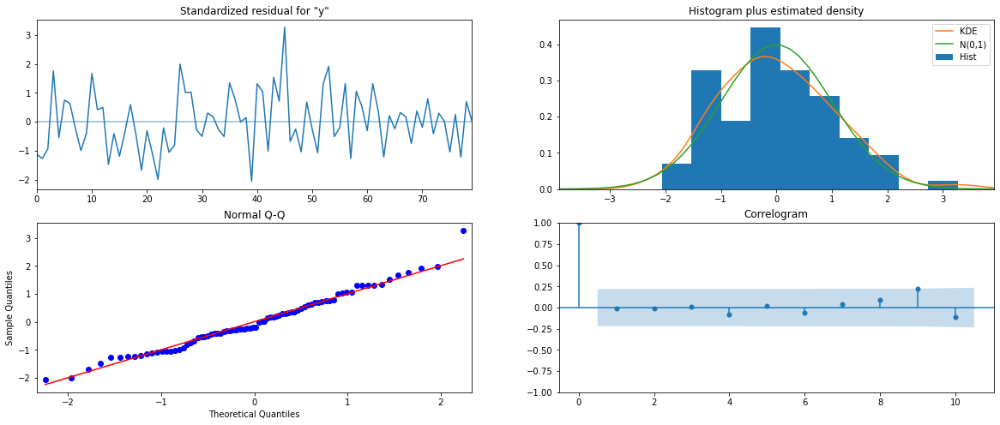

In [160]:
results_auto_Rose_SARIMA_12.plot_diagnostics()
plt.show()

# predict on the rose test set and evaluate the model

In [161]:
predicted_auto_Rose_SARIMA_12 = results_auto_Rose_SARIMA_12.get_forecast(steps=len(Rose_test))

In [162]:
predicted_auto_Rose_SARIMA_12.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,45.230490,14.458298,16.892746,73.568234
1,63.053692,14.503247,34.627850,91.479533
2,68.119687,14.453297,39.791745,96.447628
3,61.826875,14.449534,33.506309,90.147441
4,68.437081,14.470038,40.076328,96.797835


In [163]:
rmse = mean_squared_error(Rose_test['Rose'],predicted_auto_Rose_SARIMA_12.predicted_mean,squared=False)
print(rmse)

16.824029096257128


In [164]:
temp_results_RoseDf = pd.DataFrame({'Rose_test RMSE': [rmse]}
                           ,index=['SARIMA(3,1,1)(3,1,1,12)'])


results_RoseDf = pd.concat([results_RoseDf,temp_results_RoseDf])

results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570
2point_MovingAverage_Rose,68.970159
4point_MovingAverage_Rose,46.403626
6point_MovingAverage_Rose,39.126446
9point_MovingAverage_Rose,34.410938
"Alpha=0.0987,SimpleExponentialSmoothing",36.796227
"Alpha=0.10,SimpleExponentialSmoothing",36.828033
"Alpha =0.1578,Beta=0.1578,DoubleExponentialSmoothing",15.707052


# Question 7

# Build ARIMA/SARIMA models based on the cut-off points of ACF and PACF on the training data and evaluate this model on the test data using RMSE.

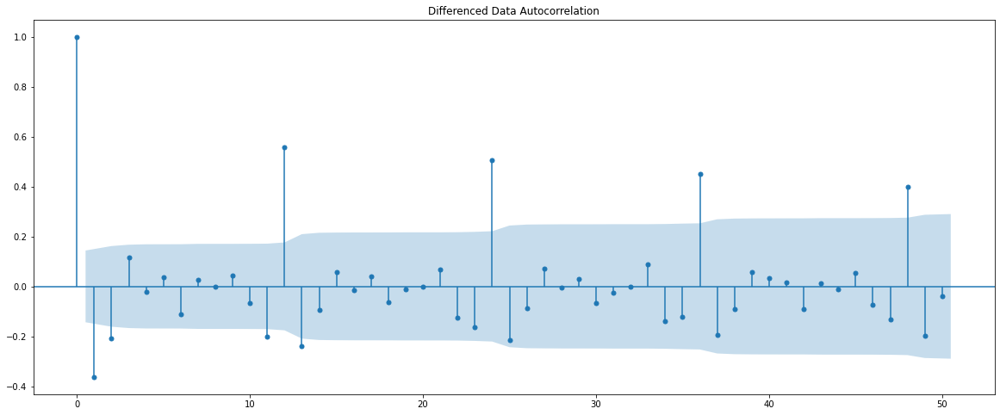

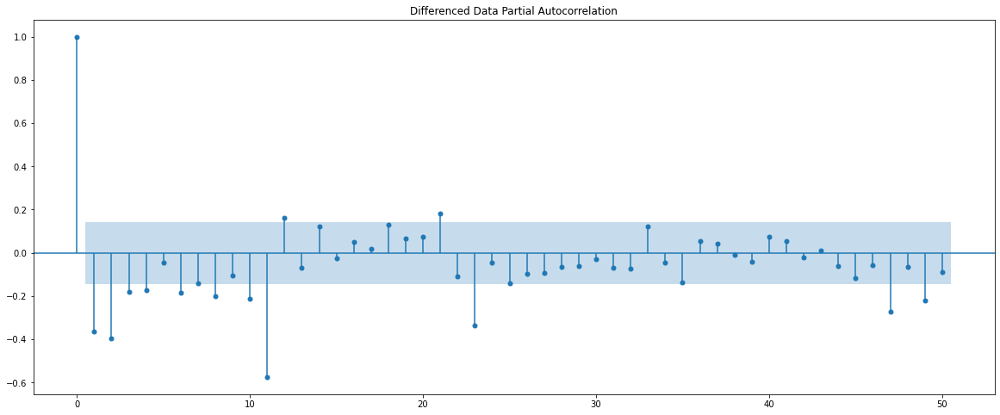

In [165]:
plot_acf(Rose['Rose'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plot_pacf(Rose['Rose'].diff().dropna(),lags=50,title='Differenced Data Partial Autocorrelation')
plt.show()

The Auto-Regressive parameter in an ARIMA model is 'p' which comes from the significant lag before which the PACF plot cuts-off to 4


The Moving-Average parameter in an ARIMA model is 'q' which comes from the significant lag before the ACF plot cuts-off to 2.

In [166]:
Rose_manual_ARIMA = ARIMA(Rose_train['Rose'].astype('float64'), order=(4,1,2))

results_Rose_manual_ARIMA = Rose_manual_ARIMA.fit()

print(results_Rose_manual_ARIMA.summary())

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will

                             ARIMA Model Results                              
Dep. Variable:                 D.Rose   No. Observations:                  131
Model:                 ARIMA(4, 1, 2)   Log Likelihood                -633.876
Method:                       css-mle   S.D. of innovations             29.793
Date:                Sun, 17 Apr 2022   AIC                           1283.753
Time:                        19:47:08   BIC                           1306.754
Sample:                    02-01-1980   HQIC                          1293.099
                         - 12-01-1990                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -0.1905      0.576     -0.331      0.741      -1.319       0.938
ar.L1.D.Rose     1.1685      0.087     13.391      0.000       0.997       1.340
ar.L2.D.Rose    -0.3562      0.132     -2.69

C:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:547: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:1521: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(np.diag(-inv(hess)))


We can see that both the AR(p) and the MA(q) model are of order 3 and 2 respectively

# Predict on the Rose_test Set using this model and evaluate the model.

In [167]:
predicted_Rose_manual_ARIMA = results_Rose_manual_ARIMA.forecast(steps=len(Rose_test))

In [168]:
rmse = mean_squared_error(Rose_test['Rose'],predicted_Rose_manual_ARIMA[0],squared=False)
print(rmse)

33.950456932235916


In [169]:
temp_results_RoseDf = pd.DataFrame({'Rose_test RMSE': [rmse]}
                           ,index=['ARIMA(4,1,2)'])


results_RoseDf = pd.concat([results_RoseDf,temp_results_RoseDf])

results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570
2point_MovingAverage_Rose,68.970159
4point_MovingAverage_Rose,46.403626
6point_MovingAverage_Rose,39.126446
9point_MovingAverage_Rose,34.410938
"Alpha=0.0987,SimpleExponentialSmoothing",36.796227
"Alpha=0.10,SimpleExponentialSmoothing",36.828033
"Alpha =0.1578,Beta=0.1578,DoubleExponentialSmoothing",15.707052


# The SARIMA model for which the best parameters are selected by looking at the ACF and the PACF plots. - Seasonality at 12

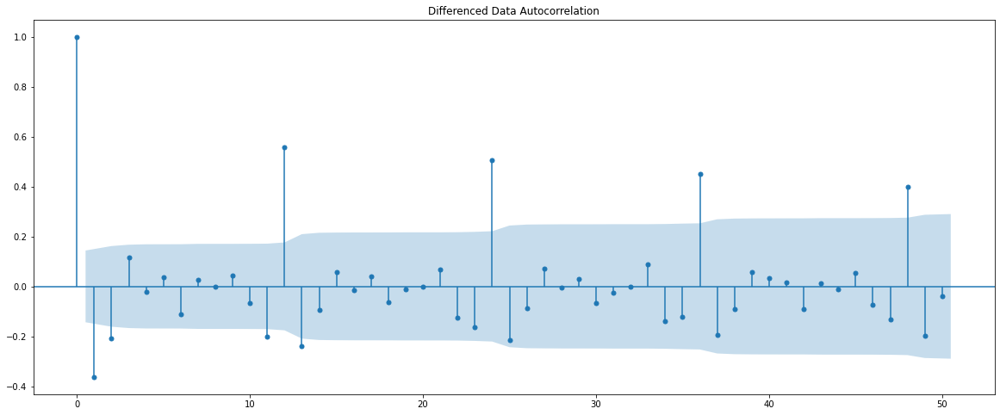

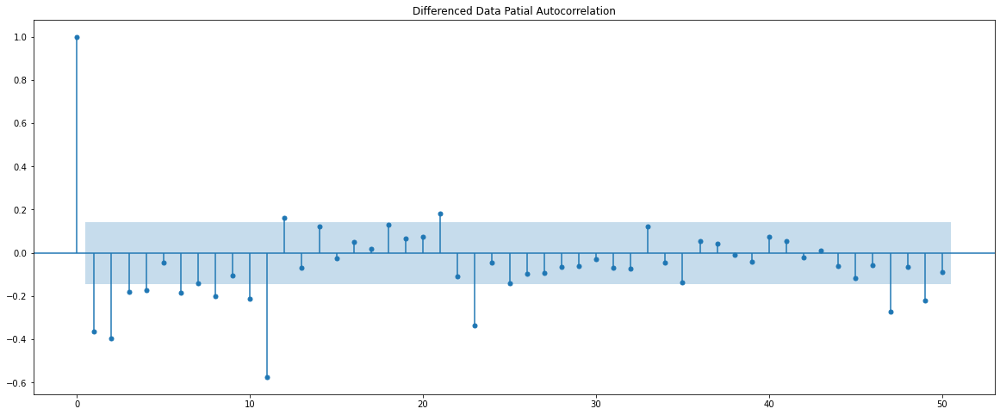

In [170]:
plot_acf(Rose['Rose'].diff().dropna(),lags=50,title='Differenced Data Autocorrelation')
plot_pacf(Rose['Rose'].diff().dropna(),lags=50,title='Differenced Data Patial Autocorrelation')
plt.show()

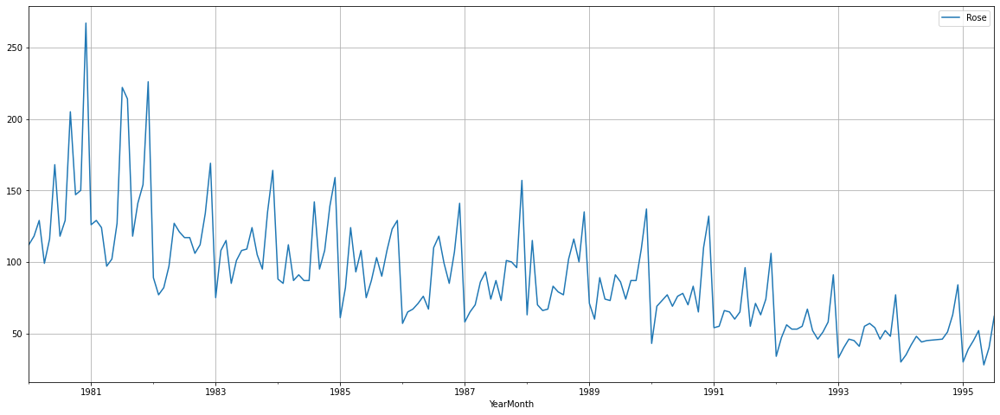

In [171]:
Rose.plot()
plt.grid();

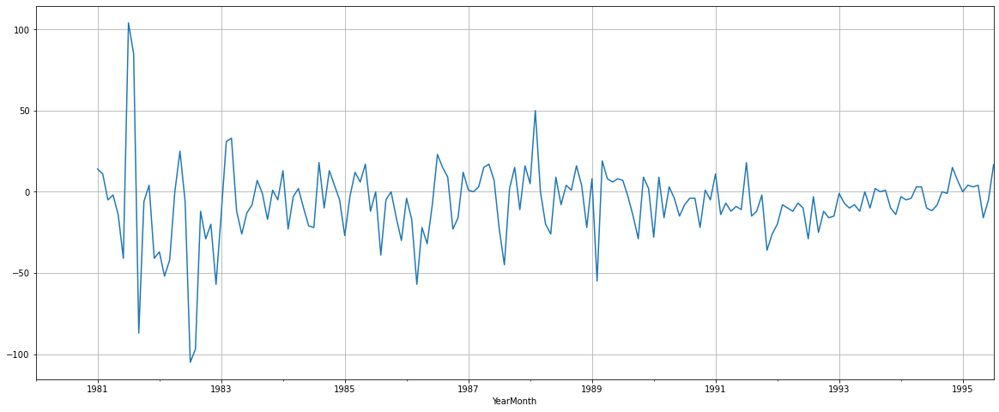

In [172]:
(Rose['Rose'].diff(12)).plot()
plt.grid();

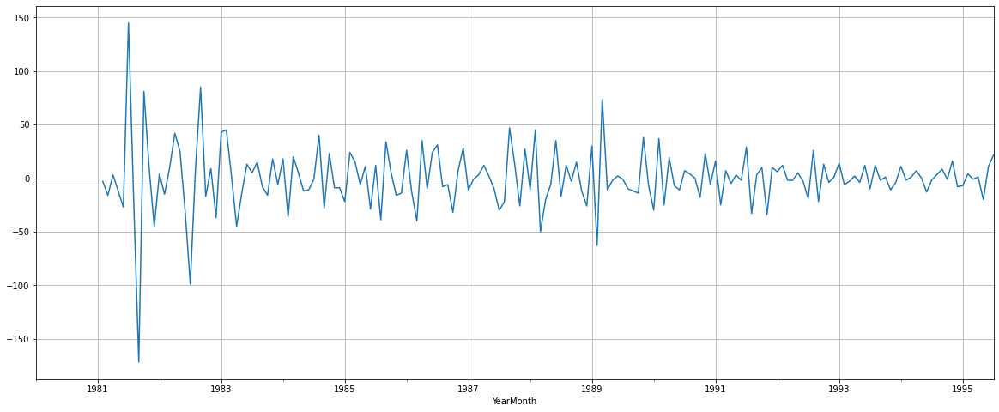

In [173]:
(Rose['Rose'].diff(12)).diff().plot()
plt.grid();

# Now we can see that there is no trend present in data.Seasonality is only present in the data.

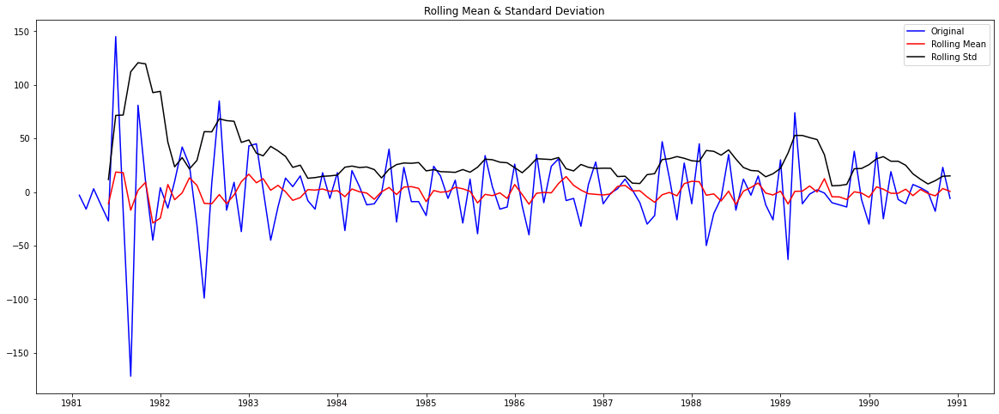

Results of Dickey-Fuller Rose_test:
Rose_test Statistic             -3.692348
p-value                          0.004222
#Lags Used                      11.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64 



In [174]:
Rose_test_stationarity((Rose_train['Rose'].diff(12).dropna()).diff(1).dropna())

# checking the ACF and PACF plots for new modified time series

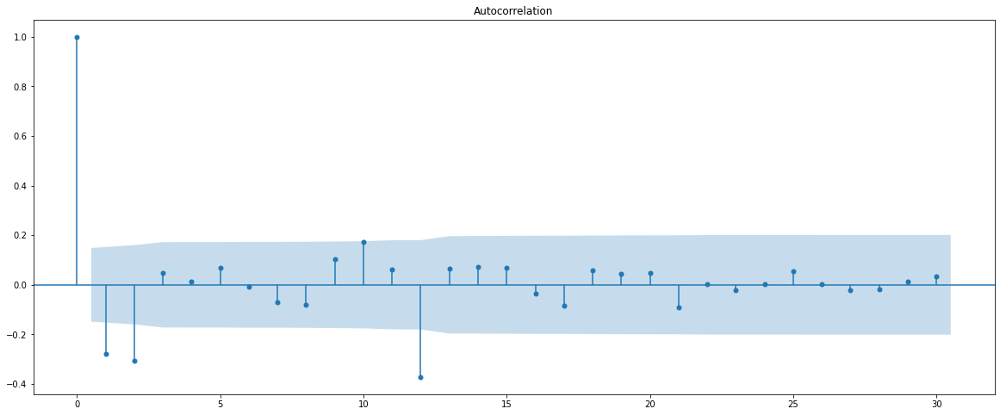

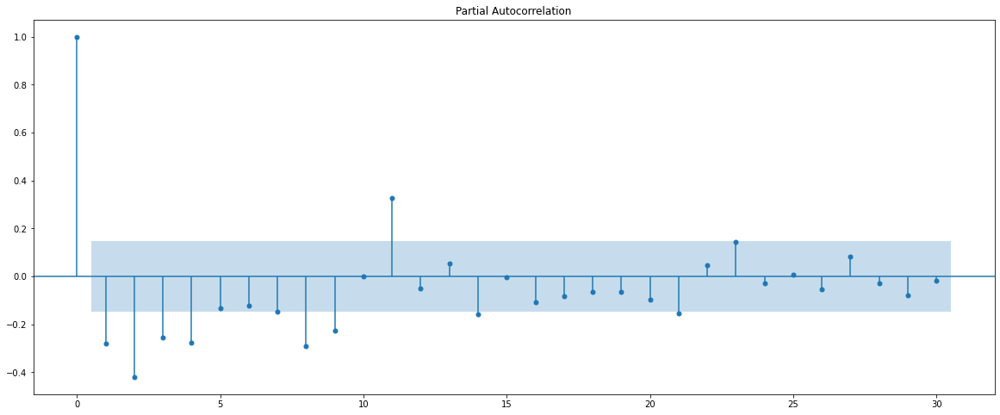

In [175]:
plot_acf((Rose['Rose'].diff(12).dropna()).diff(1).dropna(),lags=30)
plot_pacf((Rose['Rose'].diff(12).dropna()).diff(1).dropna(),lags=30);

We are going to take the seasonal period as 12.

We will keep the p(4) and q(2) parameters same as the ARIMA model.

The Auto-Regressive parameter in an SARIMA model is 'P' which comes from the significant lag after which the PACF plot cuts-off to 4.

The Moving-Average parameter in an SARIMA model is 'Q' which comes from the significant lag after which the ACF plot cuts-off to 2.

In [176]:
import statsmodels.api as sm

manual_Rose_SARIMA_12 = sm.tsa.statespace.SARIMAX(Rose_train['Rose'].values,
                                order=(4, 1, 2),
                                seasonal_order=(4, 1, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_Rose_SARIMA_12 = manual_Rose_SARIMA_12.fit(maxiter=1000)
print(results_manual_Rose_SARIMA_12.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(4, 1, 2)x(4, 1, 2, 12)   Log Likelihood                -277.661
Date:                            Sun, 17 Apr 2022   AIC                            581.322
Time:                                    19:47:32   BIC                            609.983
Sample:                                         0   HQIC                           592.663
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9743      0.189     -5.161      0.000      -1.344      -0.604
ar.L2         -0.1123      0.279   

C:\Users\User\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


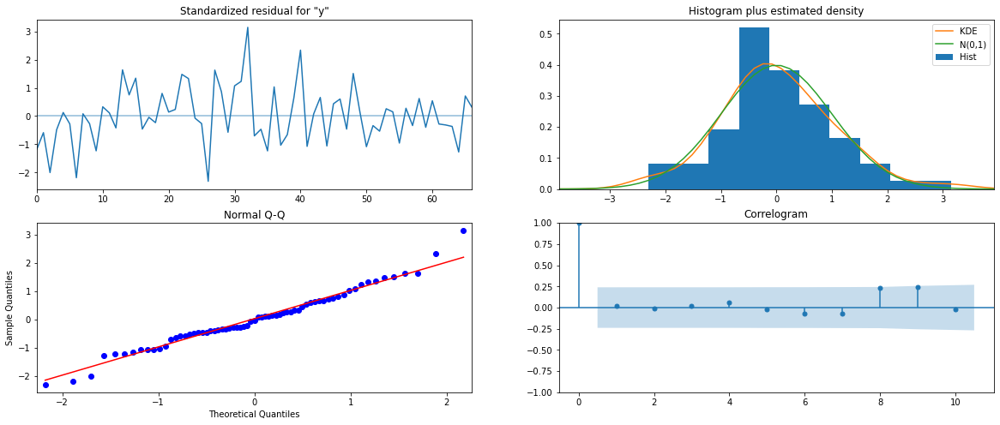

In [177]:
results_manual_Rose_SARIMA_12.plot_diagnostics()
plt.show()

# Predict on the Rose_test Set using this model and evaluate the model.

In [178]:
predicted_manual_Rose_SARIMA_12 = results_manual_Rose_SARIMA_12.get_forecast(steps=len(Rose_test))

In [179]:
predicted_manual_Rose_SARIMA_12.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,46.386385,14.771252,17.435263,75.337507
1,62.934275,14.990255,33.553914,92.314635
2,63.527464,14.999940,34.128123,92.926806
3,66.472883,15.180132,36.720371,96.225395
4,63.540686,15.181010,33.786454,93.294918


In [180]:
rmse = mean_squared_error(Rose_test['Rose'],predicted_manual_Rose_SARIMA_12.predicted_mean,squared=False)
print(rmse)

17.52937513564139


# Question 8

# Build a table (create a data frame) with all the models built along with their corresponding parameters and the respective RMSE values on the test data.

In [181]:
temp_results_RoseDf = pd.DataFrame({'Rose_test RMSE': [rmse]}
                           ,index=['SARIMA(4, 1, 2)(4,1,2,12)'])


results_RoseDf = pd.concat([results_RoseDf,temp_results_RoseDf])

results_RoseDf

,Rose_test RMSE
RegressionOnTime,15.268955
NaiveModel,79.718773
SimpleAverageModel,53.460570
2point_MovingAverage_Rose,68.970159
4point_MovingAverage_Rose,46.403626
6point_MovingAverage_Rose,39.126446
9point_MovingAverage_Rose,34.410938
"Alpha=0.0987,SimpleExponentialSmoothing",36.796227
"Alpha=0.10,SimpleExponentialSmoothing",36.828033
"Alpha =0.1578,Beta=0.1578,DoubleExponentialSmoothing",15.707052


# Alpha=0.05,Beta=0.90,Gamma=0.40,TripleExponentialSmoothing

# Question 9

# Based on the model-building exercise, build the most optimum model(s) on the complete data and predict 12 months into the future with appropriate confidence intervals/bands.

In [182]:
fullmodel1 = ExponentialSmoothing(Rose,
                                  trend='additive',
                                  seasonal='multiplicative').fit(smoothing_level=0.05,
                                                                 smoothing_slope=0.9,
                                                                 smoothing_seasonal=0.4)

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  warnings.warn('No frequency information was'
C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\Users\User\AppData\Local\Temp/ipykernel_7092/4007044674.py:1: FutureWarning: the 'smoothing_slope'' keyword is deprecated, use 'smoothing_trend' instead
  fullmodel1 = ExponentialSmoothing(Rose,


In [183]:
RMSE_fullmodel1 = metrics.mean_squared_error(Rose['Rose'],fullmodel1.fittedvalues,squared=False)

print('Rose RMSE:',RMSE_fullmodel1)

Rose RMSE: 19.971968883744363


In [184]:
# Getting the predictions for the next 12 months 
prediction_1 = fullmodel1.forecast(steps=12)

C:\Users\User\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


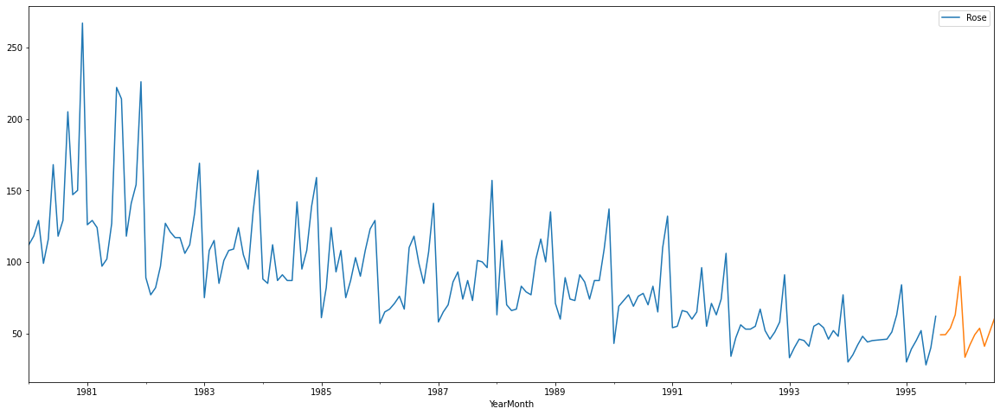

In [185]:
Rose.plot()
prediction_1.plot();

In [186]:
pred_1_df = pd.DataFrame({'lower_CI':prediction_1 - 1.96*np.std(fullmodel1.resid,ddof=1),
                          'prediction':prediction_1,
                          'upper_ci': prediction_1 + 1.96*np.std(fullmodel1.resid,ddof=1)})
pred_1_df.head()

,lower_CI,prediction,upper_ci
1995-08-01,9.848444,49.039517,88.230589
1995-09-01,9.935943,49.127016,88.318089
1995-10-01,14.519307,53.710380,92.901452
1995-11-01,23.825898,63.016970,102.208043
1995-12-01,50.717596,89.908668,129.099741


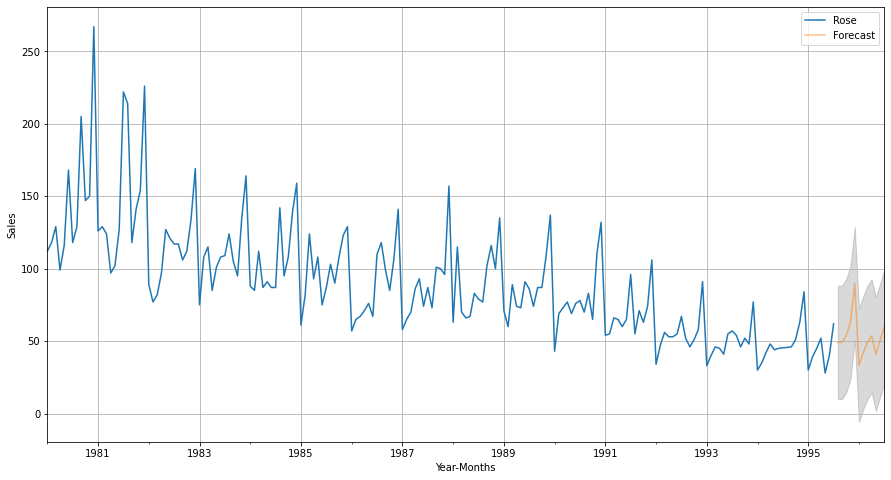

In [187]:
axis = Rose.plot(label='Actual', figsize=(15,8))
pred_1_df['prediction'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(pred_1_df.index, pred_1_df['lower_CI'], pred_1_df['upper_ci'], color='k', alpha=.15)
axis.set_xlabel('Year-Months')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.grid()
plt.show()

# Question 10

# Comment on the model thus built and report your findings and suggest the measures that the company should be taking for future sales

# Answer in PDf